In [1]:
#Libraries needed
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
from yellowbrick.cluster import KElbowVisualizer, SilhouetteVisualizer
from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score
from matplotlib import colormaps as cm
from rpy2.robjects import pandas2ri, r
import rpy2.robjects.packages as rpackages
from rpy2.robjects.packages import importr
import pbm
import geopandas as gpd
from shapely.geometry import Point
import math
from mpl_toolkits.axes_grid1 import make_axes_locatable
import kmapper as km
import pyballmapper as pbm
import statistics
import seaborn as sb
from matplotlib.colors import ListedColormap

from sklearn.preprocessing import StandardScaler, MinMaxScaler
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable
import matplotlib.patches as patches
import networkx as nx
import os




# UPLOAD WARDS DATA AND UK MAP

In [2]:
wards= pd.read_csv('generated_df/ward_codes.csv') 

In [3]:
#download the map of uk use in the census 2021
uk_shape = gpd.read_file('input_data/Wards_December_2022/WD_DEC_2022_UK_BFE.shp')

In [4]:
uk_shape = uk_shape[uk_shape['WD22CD'].str.startswith(('E'))]#only use England data
uk_shape = uk_shape.rename(columns={'WD22NM': 'ward'})
uk_shape = uk_shape.rename(columns={'WD22CD': 'wardcode'})
uk_shape = uk_shape.rename(columns={'LAD22NM': 'Local_Authority_D'})

# UPLOAD FINAL DATAFRAME

In [5]:
#df with dummies
dfWD= pd.read_csv('generated_df/dfWD.csv') 

In [6]:
#df without dummies
df= pd.read_csv('generated_df/dfwod.csv') 

In [7]:
df.set_index([df.columns[0], df.columns[1],df.columns[2]], inplace=True)


In [8]:
dfWD.head()

,wardcode,ward,Local_Authority_D,pop_density_sqrkilometer,Pborn_Europe,total_population,Ptotal_populationF,Ptotal_populationM,PEconomicallyInactive,Pwhite,...,Uni_score_ward,PriS_unique_name_count,small_communities,rural_communites,majorityL3L4q,majorityP16to49_age,dnone50,GP_above1,VeryGoodhealth,PH_above1
0,E05013038,Burn Valley,Hartlepool,2895.6,97.1,7631,51.3,48.7,48.6,94.8,...,0,4.0,0,0,0,0,0,1,0,1
1,E05013039,De Bruce,Hartlepool,2722.9,98.4,8055,52.4,47.6,49.2,97.5,...,0,3.0,0,0,0,0,0,1,0,1
2,E05013040,Fens & Greatham,Hartlepool,331.5,98.8,6380,52.1,47.9,47.3,98.8,...,0,3.0,0,0,0,0,0,1,0,1
3,E05013041,Foggy Furze,Hartlepool,4832.0,97.2,8154,51.3,48.7,48.4,96.2,...,0,3.0,0,0,0,0,0,1,0,1
4,E05013042,Hart,Hartlepool,676.0,98.9,7644,51.8,48.2,34.1,98.2,...,0,2.0,0,0,1,0,1,0,1,1


# Ballmapper

The ball's size indicates the quantity of wards with similarities.

The number in the ball is the index number

The color of the balls indicates the average value of the selected outcome variable across all included wards. 

The connections between balls indicate that at least one ward is a member of both balls 

In [9]:
dfTDA = df.copy()

In [10]:
dfWD.set_index([dfWD.columns[0], dfWD.columns[1],dfWD.columns[2]], inplace=True)


In [11]:
scaler = StandardScaler()
X_scaled = scaler.fit_transform(dfTDA)


In [12]:
X_scaled_df = pd.DataFrame(X_scaled, index=df.index, columns=df.columns)


In [13]:
X_scaled_df.head()

,,,pop_density_sqrkilometer,Pborn_Europe,total_population,Ptotal_populationF,Ptotal_populationM,PEconomicallyInactive,Pwhite,Pother_ethnic,Phousehold_notdeprived,Phousehold_deprived1D,...,Presi_L3toL4quali,PL1toL9_NS,PL10toL11_7_NS,PL12to13NS,PL14to15NS,air_score_ward,GP_unique_name_count,PH_unique_name_count,Uni_score_ward,PriS_unique_name_count
wardcode,ward,Local_Authority_D,,,,,,,,,,,,,,,,,,,,,
E05013038,Burn Valley,Hartlepool,0.068075,0.563326,-0.123780,0.165709,-0.165699,1.373991,0.491627,-0.491368,-1.089910,-0.096360,...,-0.521404,-1.292590,-0.107886,0.610253,1.403515,-0.324638,4.707615,1.213581,-0.491664,1.040543
E05013039,De Bruce,Hartlepool,0.011814,0.714817,-0.030062,0.942356,-0.942347,1.466255,0.649784,-0.649510,-1.679256,-0.061015,...,-1.485281,-2.046520,-0.239474,1.830798,1.321938,-0.324638,4.707615,0.514471,-0.491664,0.458097
E05013040,Fens & Greatham,Hartlepool,-0.767240,0.761429,-0.400292,0.730543,-0.730534,1.174087,0.725933,-0.719795,-0.320153,0.928638,...,-0.608153,-0.845492,1.372478,0.661645,0.043901,-0.324638,-0.189983,0.514471,-0.491664,0.458097
E05013041,Foggy Furze,Hartlepool,0.698903,0.574979,-0.008180,0.165709,-0.165699,1.343237,0.573634,-0.573368,-1.258295,0.363122,...,-1.186479,-1.643255,0.155289,1.496754,0.886861,-0.324638,0.255253,0.514471,-0.491664,0.458097
E05013042,Hart,Hartlepool,-0.655011,0.773083,-0.120907,0.518730,-0.518721,-0.855709,0.690787,-0.690510,0.738263,-1.015324,...,0.403917,-0.205527,1.010611,0.070644,-0.173637,-0.324638,-0.635219,-0.184640,-0.491664,-0.124350


<Axes: >

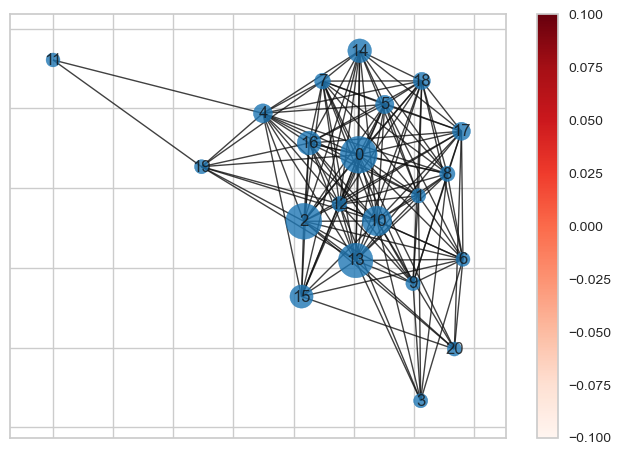

In [14]:

X = X_scaled_df


bm1 = pbm.BallMapper(X=X, eps=10)

bm1.draw_networkx(colorbar=True , pos=nx.spring_layout(bm1.Graph, seed=1))

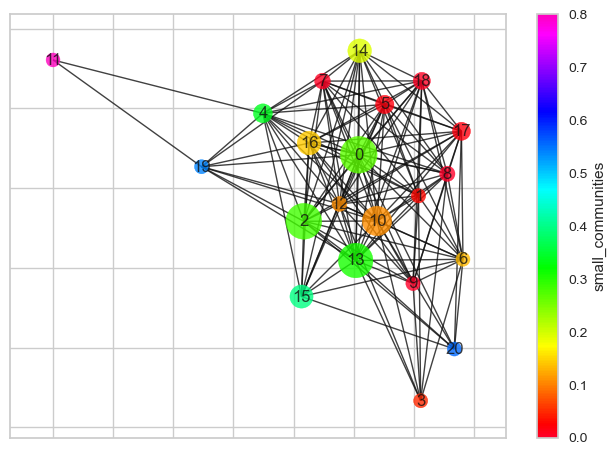

In [15]:
hsvp = cm.get_cmap("gist_rainbow")

cdf = pd.DataFrame(dfWD['small_communities'])
cdf = cdf.reset_index(drop=True)

bm1=pbm.BallMapper(X=X, eps=10, coloring_df=cdf)

bm1.draw_networkx(coloring_variable='small_communities', color_palette=hsvp, colorbar=True, colorbar_label="small_communities", pos=nx.spring_layout(bm1.Graph, seed=1))

output_dir = 'generated_df/TDABM_figures'
os.makedirs(output_dir, exist_ok=True)

plt.savefig(os.path.join(output_dir, 'small_communities_TDABM.png'), bbox_inches='tight')



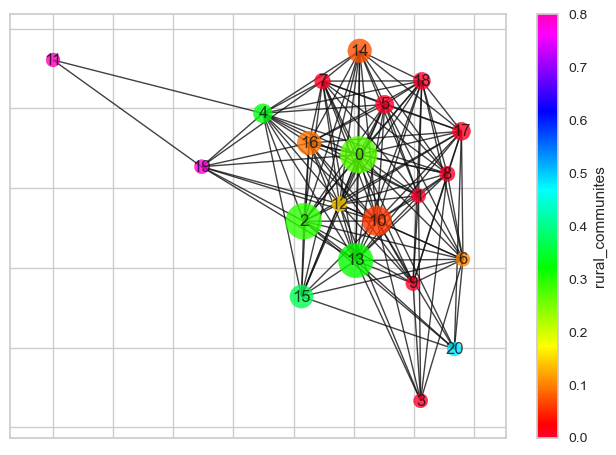

In [16]:
hsvp = cm.get_cmap("gist_rainbow")

cdf = pd.DataFrame(dfWD['rural_communites'])
cdf = cdf.reset_index(drop=True)


bm1=pbm.BallMapper(X=X, eps=10, coloring_df=cdf)

bm1.draw_networkx(coloring_variable='rural_communites', color_palette=hsvp, colorbar=True, colorbar_label="rural_communites", pos=nx.spring_layout(bm1.Graph, seed=1))

output_dir = 'generated_df/TDABM_figures'
os.makedirs(output_dir, exist_ok=True)

plt.savefig(os.path.join(output_dir, 'rural_communites_TDABM.png'), bbox_inches='tight')




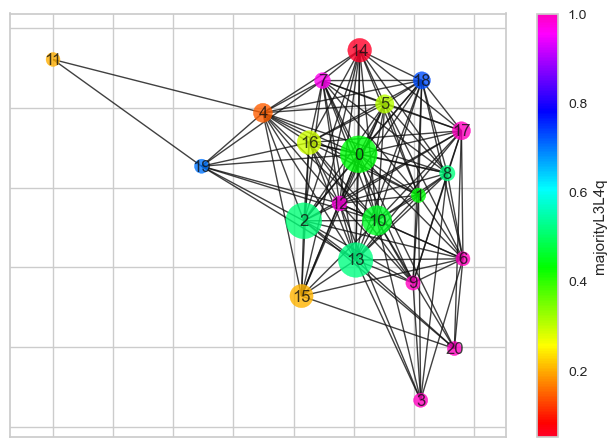

In [17]:
hsvp = cm.get_cmap("gist_rainbow")

cdf = pd.DataFrame(dfWD['majorityL3L4q'])
cdf = cdf.reset_index(drop=True)


bm1=pbm.BallMapper(X=X, eps=10, coloring_df=cdf)

bm1.draw_networkx(coloring_variable='majorityL3L4q', color_palette=hsvp, colorbar=True, colorbar_label="majorityL3L4q", pos=nx.spring_layout(bm1.Graph, seed=1))

output_dir = 'generated_df/TDABM_figures'
os.makedirs(output_dir, exist_ok=True)

plt.savefig(os.path.join(output_dir, 'majorityL3L4q_TDABM.png'), bbox_inches='tight')



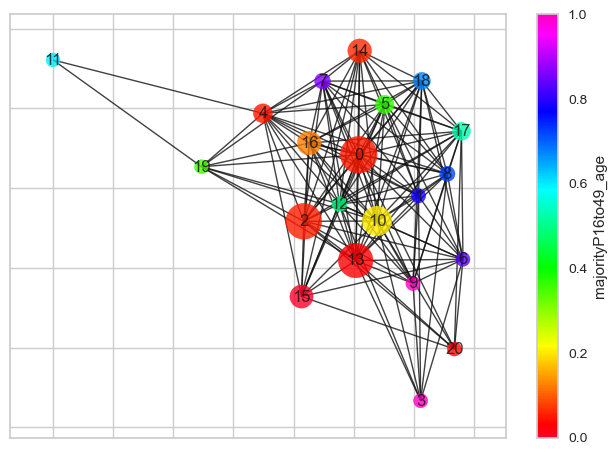

In [18]:
hsvp = cm.get_cmap("gist_rainbow")

cdf = pd.DataFrame(dfWD['majorityP16to49_age'])
cdf = cdf.reset_index(drop=True)


bm1=pbm.BallMapper(X=X, eps=10, coloring_df=cdf)

bm1.draw_networkx(coloring_variable='majorityP16to49_age', color_palette=hsvp, colorbar=True, colorbar_label="majorityP16to49_age", pos=nx.spring_layout(bm1.Graph, seed=1))

output_dir = 'generated_df/TDABM_figures'
os.makedirs(output_dir, exist_ok=True)

plt.savefig(os.path.join(output_dir, 'majorityP16to49_age_TDABM.png'), bbox_inches='tight')



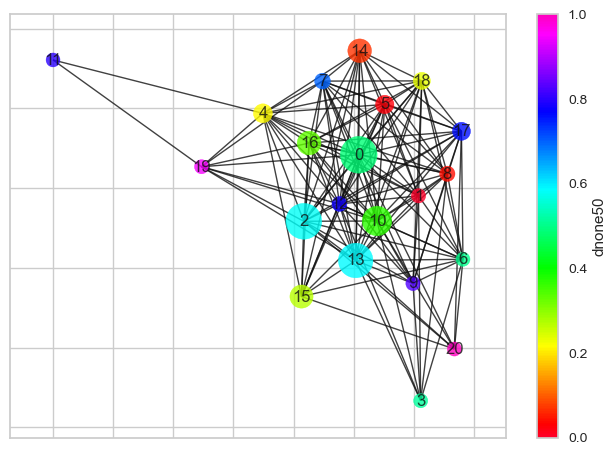

In [19]:
hsvp = cm.get_cmap("gist_rainbow")

cdf = pd.DataFrame(dfWD['dnone50'])
cdf = cdf.reset_index(drop=True)


bm1=pbm.BallMapper(X=X, eps=10, coloring_df=cdf)

bm1.draw_networkx(coloring_variable='dnone50', color_palette=hsvp, colorbar=True, colorbar_label="dnone50", pos=nx.spring_layout(bm1.Graph, seed=1))

output_dir = 'generated_df/TDABM_figures'
os.makedirs(output_dir, exist_ok=True)

plt.savefig(os.path.join(output_dir, 'dnone50_TDABM.png'), bbox_inches='tight')



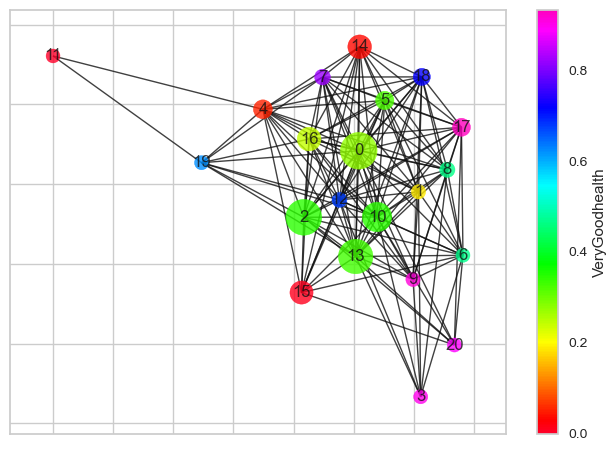

In [20]:
hsvp = cm.get_cmap("gist_rainbow")

cdf = pd.DataFrame(dfWD['VeryGoodhealth'])
cdf = cdf.reset_index(drop=True)


bm1=pbm.BallMapper(X=X, eps=10, coloring_df=cdf)

bm1.draw_networkx(coloring_variable='VeryGoodhealth', color_palette=hsvp, colorbar=True, colorbar_label="VeryGoodhealth", pos=nx.spring_layout(bm1.Graph, seed=1))

output_dir = 'generated_df/TDABM_figures'
os.makedirs(output_dir, exist_ok=True)

plt.savefig(os.path.join(output_dir, 'VeryGoodhealth_TDABM.png'), bbox_inches='tight')



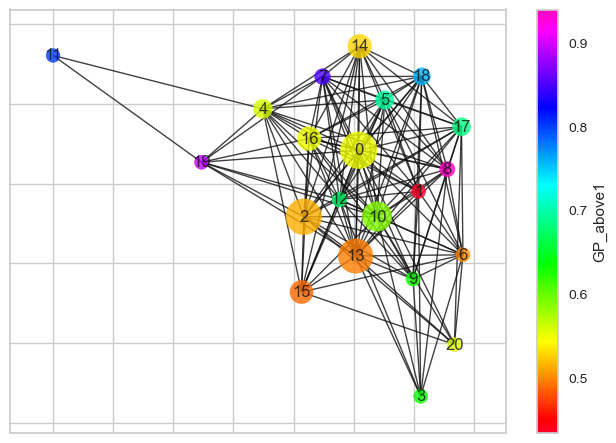

In [21]:
hsvp = cm.get_cmap("gist_rainbow")

cdf = pd.DataFrame(dfWD['GP_above1'])
cdf = cdf.reset_index(drop=True)



bm1=pbm.BallMapper(X=X, eps=10, coloring_df=cdf)

bm1.draw_networkx(coloring_variable='GP_above1', color_palette=hsvp, colorbar=True, colorbar_label="GP_above1", pos=nx.spring_layout(bm1.Graph, seed=1))

output_dir = 'generated_df/TDABM_figures'
os.makedirs(output_dir, exist_ok=True)

plt.savefig(os.path.join(output_dir, 'GP_above1_TDABM.png'), bbox_inches='tight')



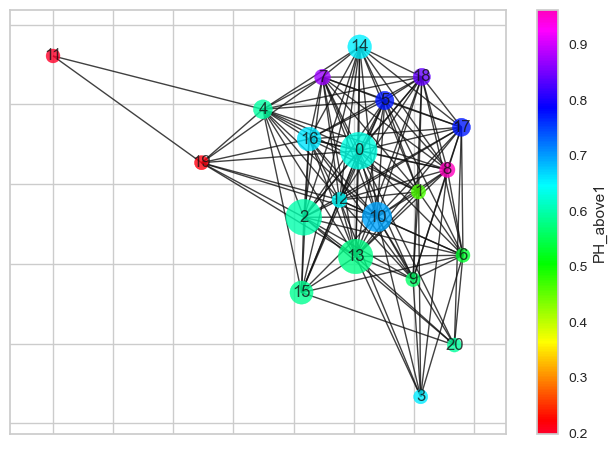

In [22]:
hsvp = cm.get_cmap("gist_rainbow")

cdf = pd.DataFrame(dfWD['PH_above1'])
cdf = cdf.reset_index(drop=True)


bm1=pbm.BallMapper(X=X, eps=10, coloring_df=cdf)

bm1.draw_networkx(coloring_variable='PH_above1', color_palette=hsvp, colorbar=True, colorbar_label="PH_above1", pos=nx.spring_layout(bm1.Graph, seed=1))

output_dir = 'generated_df/TDABM_figures'
os.makedirs(output_dir, exist_ok=True)

plt.savefig(os.path.join(output_dir, 'PH_above1_TDABM.png'), bbox_inches='tight')



In [23]:
cdf = cdf.reset_index()


In [24]:
cdf

,index,PH_above1
0,0,1
1,1,1
2,2,1
3,3,1
4,4,1
...,...,...
6871,6871,1
6872,6872,1
6873,6873,1
6874,6874,1


In [25]:
pb1 = bm1.points_and_balls()

In [26]:
pb1.describe()

,point,ball
count,29484.000000,29484.000000
mean,3422.453331,7.883462
std,1975.226809,6.234411
min,0.000000,0.000000
25%,1746.000000,2.000000
50%,3410.000000,10.000000
75%,5108.250000,13.000000
max,6875.000000,20.000000


point is the index number of the data set and the ball number then corresponds to the plot. Python gives us a ball 0, users of R will find that the first ball is numbered 1. The 0 is kept because it corresponds with the indexing in a standard Python data frame.

We will merge our balls list with the large version of the data frame uk_results. We need to first create a column for the index number of each row

# JOIN CLUSTERS WITH DATASETS

In [27]:
#CREATE df_clusters copying standarize data
df_clusters= X_scaled_df.reset_index()
dfWD = dfWD.reset_index()


In [28]:
#add dummy variables to df_clusters
df_clusters[['small_communities', 'rural_communites','majorityL3L4q','majorityP16to49_age','dnone50','GP_above1','VeryGoodhealth','PH_above1']] = dfWD[['small_communities', 'rural_communites','majorityL3L4q','majorityP16to49_age','dnone50','GP_above1','VeryGoodhealth','PH_above1']]


In [29]:
df_clusters

,wardcode,ward,Local_Authority_D,pop_density_sqrkilometer,Pborn_Europe,total_population,Ptotal_populationF,Ptotal_populationM,PEconomicallyInactive,Pwhite,...,Uni_score_ward,PriS_unique_name_count,small_communities,rural_communites,majorityL3L4q,majorityP16to49_age,dnone50,GP_above1,VeryGoodhealth,PH_above1
0,E05013038,Burn Valley,Hartlepool,0.068075,0.563326,-0.123780,0.165709,-0.165699,1.373991,0.491627,...,-0.491664,1.040543,0,0,0,0,0,1,0,1
1,E05013039,De Bruce,Hartlepool,0.011814,0.714817,-0.030062,0.942356,-0.942347,1.466255,0.649784,...,-0.491664,0.458097,0,0,0,0,0,1,0,1
2,E05013040,Fens & Greatham,Hartlepool,-0.767240,0.761429,-0.400292,0.730543,-0.730534,1.174087,0.725933,...,-0.491664,0.458097,0,0,0,0,0,1,0,1
3,E05013041,Foggy Furze,Hartlepool,0.698903,0.574979,-0.008180,0.165709,-0.165699,1.343237,0.573634,...,-0.491664,0.458097,0,0,0,0,0,1,0,1
4,E05013042,Hart,Hartlepool,-0.655011,0.773083,-0.120907,0.518730,-0.518721,-0.855709,0.690787,...,-0.491664,-0.124350,0,0,1,0,1,0,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6871,E05014383,Taunton North,Somerset West and Taunton,0.133198,0.516713,0.509699,-0.116709,0.116719,-0.563542,0.509200,...,-0.491664,0.458097,0,0,0,0,0,1,0,1
6872,E05014384,Taunton South,Somerset West and Taunton,0.163266,0.365222,0.683652,0.659938,-0.659930,-0.117601,0.485769,...,-0.491664,0.458097,0,0,0,0,1,1,0,1
6873,E05014385,Upper Tone,Somerset West and Taunton,-0.854222,0.528366,0.270100,0.024500,-0.024490,0.620506,0.690787,...,-0.491664,2.205437,0,1,1,0,1,1,0,1
6874,E05014386,Watchet & Stogursey,Somerset West and Taunton,-0.838617,0.633245,0.319390,0.518730,-0.518721,1.650782,0.702502,...,-0.491664,0.458097,0,1,0,0,0,1,0,1


In [30]:
#add balls number to dfWD
dfWD['point'] = dfWD.index

In [31]:
dfWD = dfWD.merge(pb1, on='point')

In [32]:
dfWD

,wardcode,ward,Local_Authority_D,pop_density_sqrkilometer,Pborn_Europe,total_population,Ptotal_populationF,Ptotal_populationM,PEconomicallyInactive,Pwhite,...,small_communities,rural_communites,majorityL3L4q,majorityP16to49_age,dnone50,GP_above1,VeryGoodhealth,PH_above1,point,ball
0,E05013038,Burn Valley,Hartlepool,2895.6,97.1,7631,51.3,48.7,48.6,94.8,...,0,0,0,0,0,1,0,1,0,0
1,E05013039,De Bruce,Hartlepool,2722.9,98.4,8055,52.4,47.6,49.2,97.5,...,0,0,0,0,0,1,0,1,1,0
2,E05013040,Fens & Greatham,Hartlepool,331.5,98.8,6380,52.1,47.9,47.3,98.8,...,0,0,0,0,0,1,0,1,2,0
3,E05013040,Fens & Greatham,Hartlepool,331.5,98.8,6380,52.1,47.9,47.3,98.8,...,0,0,0,0,0,1,0,1,2,2
4,E05013040,Fens & Greatham,Hartlepool,331.5,98.8,6380,52.1,47.9,47.3,98.8,...,0,0,0,0,0,1,0,1,2,13
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29479,E05014387,Wellington (Somerset West and Taunton),NaN,1806.5,96.0,13040,51.3,48.7,40.6,96.3,...,0,0,0,0,0,0,0,0,6875,10
29480,E05014387,Wellington (Somerset West and Taunton),NaN,1806.5,96.0,13040,51.3,48.7,40.6,96.3,...,0,0,0,0,0,0,0,0,6875,13
29481,E05014387,Wellington (Somerset West and Taunton),NaN,1806.5,96.0,13040,51.3,48.7,40.6,96.3,...,0,0,0,0,0,0,0,0,6875,14
29482,E05014387,Wellington (Somerset West and Taunton),NaN,1806.5,96.0,13040,51.3,48.7,40.6,96.3,...,0,0,0,0,0,0,0,0,6875,15


In [33]:
#add balls number to df_clusters
df_clusters['point'] = df_clusters.index

In [34]:
df_clusters = df_clusters.merge(pb1, on='point')

In [35]:
df_clusters

,wardcode,ward,Local_Authority_D,pop_density_sqrkilometer,Pborn_Europe,total_population,Ptotal_populationF,Ptotal_populationM,PEconomicallyInactive,Pwhite,...,small_communities,rural_communites,majorityL3L4q,majorityP16to49_age,dnone50,GP_above1,VeryGoodhealth,PH_above1,point,ball
0,E05013038,Burn Valley,Hartlepool,0.068075,0.563326,-0.123780,0.165709,-0.165699,1.373991,0.491627,...,0,0,0,0,0,1,0,1,0,0
1,E05013039,De Bruce,Hartlepool,0.011814,0.714817,-0.030062,0.942356,-0.942347,1.466255,0.649784,...,0,0,0,0,0,1,0,1,1,0
2,E05013040,Fens & Greatham,Hartlepool,-0.767240,0.761429,-0.400292,0.730543,-0.730534,1.174087,0.725933,...,0,0,0,0,0,1,0,1,2,0
3,E05013040,Fens & Greatham,Hartlepool,-0.767240,0.761429,-0.400292,0.730543,-0.730534,1.174087,0.725933,...,0,0,0,0,0,1,0,1,2,2
4,E05013040,Fens & Greatham,Hartlepool,-0.767240,0.761429,-0.400292,0.730543,-0.730534,1.174087,0.725933,...,0,0,0,0,0,1,0,1,2,13
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29479,E05014387,Wellington (Somerset West and Taunton),NaN,-0.286724,0.435141,1.071785,0.165709,-0.165699,0.143812,0.579492,...,0,0,0,0,0,0,0,0,6875,10
29480,E05014387,Wellington (Somerset West and Taunton),NaN,-0.286724,0.435141,1.071785,0.165709,-0.165699,0.143812,0.579492,...,0,0,0,0,0,0,0,0,6875,13
29481,E05014387,Wellington (Somerset West and Taunton),NaN,-0.286724,0.435141,1.071785,0.165709,-0.165699,0.143812,0.579492,...,0,0,0,0,0,0,0,0,6875,14
29482,E05014387,Wellington (Somerset West and Taunton),NaN,-0.286724,0.435141,1.071785,0.165709,-0.165699,0.143812,0.579492,...,0,0,0,0,0,0,0,0,6875,15


In [36]:
csv_file_path = 'generated_df/TDABM_tables/ballmapper_clusters_df.csv'
df_clusters.to_csv(csv_file_path, index=True)


In [37]:
df_clusters['ball'].describe()


count    29484.000000
mean         7.883462
std          6.234411
min          0.000000
25%          2.000000
50%         10.000000
75%         13.000000
max         20.000000
Name: ball, dtype: float64

# PARTICIPATION (MEAN)

TABLE 4 IN ERP

In [38]:
#create a new DF with the percentage of participation of each dummy variable TABLE 4 IN ERP
result = {}

total_wards_per_cluster = df_clusters.groupby('ball').size()

for column in ['small_communities', 'rural_communites', 'majorityL3L4q', 
                'majorityP16to49_age', 'dnone50', 'GP_above1', 
                'VeryGoodhealth', 'PH_above1']:
    
    positive_counts = df_clusters.groupby('ball')[column].apply(lambda x: (x > 0).sum())
    
    percentages = (positive_counts / total_wards_per_cluster) * 100
    
    result[column] = percentages

result_df = pd.DataFrame(result).fillna(0)

size = df_clusters['ball'].value_counts()

result_df['size'] = size

result_df

,small_communities,rural_communites,majorityL3L4q,majorityP16to49_age,dnone50,GP_above1,VeryGoodhealth,PH_above1,size
ball,,,,,,,,,
0,26.598250,26.917900,43.808883,4.912517,48.620458,55.063930,27.641319,63.189771,5944
1,2.898551,0.000000,43.478261,78.260870,0.000000,43.478261,18.840580,46.376812,69
2,28.405849,29.440086,51.337375,5.099857,58.166904,51.551355,34.593438,59.985735,5608
3,4.878049,0.000000,100.000000,100.000000,51.219512,63.414634,90.243902,65.853659,41
4,33.835458,32.908459,14.252607,4.866744,21.436848,55.735805,5.446118,59.559676,863
5,1.735648,0.000000,30.574099,36.582109,2.536716,69.692924,32.176235,77.436582,749
6,13.333333,10.000000,100.000000,83.333333,50.000000,50.000000,46.666667,53.333333,30
7,0.334448,0.334448,96.655518,86.287625,69.565217,84.949833,82.274247,87.290970,299
8,0.000000,0.000000,51.627907,72.093023,4.186047,93.953488,46.511628,96.279070,215


In [39]:
#save table
csv_file_path = 'generated_df/TDABM_tables/ballmapper_percentagedummy_df.csv'
result_df.to_csv(csv_file_path, index=True)

In [40]:
#create latex code for table
latex_code = result_df.to_latex(index=True, caption='Percentage of wards with Positive Dummy Variables by node', label='tab:tdabm_dummy_variable_percentages')

output_folder = 'generated_df/TDABM_tables'
output_filename = os.path.join(output_folder, 'TDABMdummy_variable_percentages.tex')

os.makedirs(output_folder, exist_ok=True)

with open(output_filename, 'w') as file:
    file.write(latex_code)

print(f"LaTeX table saved to {output_filename}")

LaTeX table saved to generated_df/TDABM_tables/TDABMdummy_variable_percentages.tex


/var/folders/r0/53lbrfvx4kd2t6dzcz18qbhr0000gn/T/ipykernel_51305/3052839165.py:2: FutureWarning: In future versions `DataFrame.to_latex` is expected to utilise the base implementation of `Styler.to_latex` for formatting and rendering. The arguments signature may therefore change. It is recommended instead to use `DataFrame.style.to_latex` which also contains additional functionality.
  latex_code = result_df.to_latex(index=True, caption='Percentage of wards with Positive Dummy Variables by node', label='tab:tdabm_dummy_variable_percentages')


# MEAN NOT STANDARIZED DATA

In [41]:
#dfWD has the not standazarized data
dfWD

,wardcode,ward,Local_Authority_D,pop_density_sqrkilometer,Pborn_Europe,total_population,Ptotal_populationF,Ptotal_populationM,PEconomicallyInactive,Pwhite,...,small_communities,rural_communites,majorityL3L4q,majorityP16to49_age,dnone50,GP_above1,VeryGoodhealth,PH_above1,point,ball
0,E05013038,Burn Valley,Hartlepool,2895.6,97.1,7631,51.3,48.7,48.6,94.8,...,0,0,0,0,0,1,0,1,0,0
1,E05013039,De Bruce,Hartlepool,2722.9,98.4,8055,52.4,47.6,49.2,97.5,...,0,0,0,0,0,1,0,1,1,0
2,E05013040,Fens & Greatham,Hartlepool,331.5,98.8,6380,52.1,47.9,47.3,98.8,...,0,0,0,0,0,1,0,1,2,0
3,E05013040,Fens & Greatham,Hartlepool,331.5,98.8,6380,52.1,47.9,47.3,98.8,...,0,0,0,0,0,1,0,1,2,2
4,E05013040,Fens & Greatham,Hartlepool,331.5,98.8,6380,52.1,47.9,47.3,98.8,...,0,0,0,0,0,1,0,1,2,13
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29479,E05014387,Wellington (Somerset West and Taunton),NaN,1806.5,96.0,13040,51.3,48.7,40.6,96.3,...,0,0,0,0,0,0,0,0,6875,10
29480,E05014387,Wellington (Somerset West and Taunton),NaN,1806.5,96.0,13040,51.3,48.7,40.6,96.3,...,0,0,0,0,0,0,0,0,6875,13
29481,E05014387,Wellington (Somerset West and Taunton),NaN,1806.5,96.0,13040,51.3,48.7,40.6,96.3,...,0,0,0,0,0,0,0,0,6875,14
29482,E05014387,Wellington (Somerset West and Taunton),NaN,1806.5,96.0,13040,51.3,48.7,40.6,96.3,...,0,0,0,0,0,0,0,0,6875,15


In [42]:
#calculate mean
columns = [
    'pop_density_sqrkilometer','Pborn_Europe', 'total_population', 'Ptotal_populationF', 'Ptotal_populationM', 
    'PEconomicallyInactive', 'Pwhite', 'Pother_ethnic', 'Phousehold_notdeprived', 
    'Phousehold_deprived1D', 'PhouseOwned', 'PhouseSocialRented', 'PhousePrivateRented', 
    'P0to15_age', 'P16to49_age', 'P50over_age', 'Pborn_outsideEurope', 'Pinemployment', 
    'Punemployment', 'Phousehold_D2ormore', 'Presi_0toL1quali', 'Presi_L2toApprequali', 
    'Presi_L3toL4quali', 'PL1toL9_NS', 'PL10toL11_7_NS', 'PL12to13NS', 'PL14to15NS', 
    'air_score_ward', 'GP_unique_name_count', 'PH_unique_name_count', 'Uni_score_ward', 
    'PriS_unique_name_count','small_communities', 'rural_communites', 'majorityL3L4q', 
                'majorityP16to49_age', 'dnone50', 'GP_above1', 
                'VeryGoodhealth', 'PH_above1'
]

means = {}

for col in columns:
    means[col] = dfWD.groupby('ball')[col].mean()

ballmapper_means_df12 = pd.DataFrame(means)
ballmapper_means_df12
size = dfWD['ball'].value_counts()

ballmapper_means_df12['size'] = size

ballmapper_means_df_transposed1 = ballmapper_means_df12.T
ballmapper_means_df_transposed1

ball,0,1,2,3,4,5,6,7,8,9,...,11,12,13,14,15,16,17,18,19,20
pop_density_sqrkilometer,2101.260801,6106.331884,1926.145257,5768.056098,1596.096060,6272.764753,3004.206667,7636.507692,7963.957674,7314.854386,...,199.40,2854.698101,1713.078521,2946.478541,1357.023386,3127.996963,6794.948472,7984.817803,337.270270,637.025926
Pborn_Europe,94.293725,75.985507,94.528513,84.195122,96.303824,77.316288,89.523333,80.160535,70.638140,77.864912,...,96.20,88.201266,95.155681,94.445613,97.365176,90.450733,81.192431,75.989962,92.281081,91.925926
total_population,7791.414367,12945.942029,7344.317939,12034.170732,6660.833140,13157.817089,8742.833333,12587.107023,16316.000000,11930.315789,...,4222.80,8696.645570,6931.830739,8037.935518,5869.172707,8771.149738,11191.532751,13250.308712,5102.081081,4868.481481
Ptotal_populationF,51.165276,48.407246,51.144579,50.346341,49.660255,50.765955,53.376667,50.174916,50.419535,48.835088,...,34.34,49.642405,51.253385,50.885465,51.500000,50.521937,51.413974,51.125189,42.883784,53.974074
Ptotal_populationM,48.834707,51.592754,48.855421,49.653659,50.339745,49.234045,46.620000,49.825084,49.580465,51.164912,...,65.66,50.356962,48.746595,49.114535,48.500000,49.478063,48.586026,48.874811,57.116216,46.025926
PEconomicallyInactive,40.198721,46.647826,39.176623,59.575610,41.617265,39.339252,51.646667,30.957525,42.290233,39.070175,...,56.72,43.605696,40.141128,39.410941,45.508494,36.300105,32.904658,33.880682,37.505405,43.322222
Pwhite,89.879980,49.359420,90.974001,74.902439,94.063731,51.947797,83.246667,67.681271,39.686977,69.331579,...,88.36,81.777848,92.288307,89.380444,96.343488,82.010628,69.252402,53.810038,89.448649,90.985185
Pother_ethnic,10.116353,50.636232,9.021826,25.075610,5.932561,48.050734,16.746667,32.317391,60.310698,30.663158,...,11.58,18.211392,7.707607,10.614112,3.651812,17.985079,30.745560,46.187500,10.540541,9.011111
Phousehold_notdeprived,49.136827,35.556522,51.510378,51.468293,45.650174,38.767423,50.346667,53.386288,37.094884,56.443860,...,56.36,55.148734,51.523658,42.542970,46.147452,47.235969,55.126783,45.136742,56.978378,60.392593
Phousehold_deprived1D,33.756258,36.137681,33.136894,32.939024,34.936037,35.707877,33.376667,30.767893,35.769302,30.533333,...,31.32,31.710127,33.262257,35.125423,35.622310,34.387958,30.476710,33.888258,31.986486,29.785185


In [43]:
csv_file_path = 'generated_df/TDABM_tables/notstandarizedballmapper_means_df.csv'
ballmapper_means_df_transposed1.to_csv(csv_file_path, index=True)

# MEAN STANDARIZED DATA

In [44]:
columns = [
    'pop_density_sqrkilometer','Pborn_Europe', 'total_population', 'Ptotal_populationF', 'Ptotal_populationM', 
    'PEconomicallyInactive', 'Pwhite', 'Pother_ethnic', 'Phousehold_notdeprived', 
    'Phousehold_deprived1D', 'PhouseOwned', 'PhouseSocialRented', 'PhousePrivateRented', 
    'P0to15_age', 'P16to49_age', 'P50over_age', 'Pborn_outsideEurope', 'Pinemployment', 
    'Punemployment', 'Phousehold_D2ormore', 'Presi_0toL1quali', 'Presi_L2toApprequali', 
    'Presi_L3toL4quali', 'PL1toL9_NS', 'PL10toL11_7_NS', 'PL12to13NS', 'PL14to15NS', 
    'air_score_ward', 'GP_unique_name_count', 'PH_unique_name_count', 'Uni_score_ward', 
    'PriS_unique_name_count','small_communities', 'rural_communites', 'majorityL3L4q', 
                'majorityP16to49_age', 'dnone50', 'GP_above1', 
                'VeryGoodhealth', 'PH_above1'
]

means = {}

for col in columns:
    means[col] = df_clusters.groupby('ball')[col].mean()

ballmapper_means_df = pd.DataFrame(means)
ballmapper_means_df

size = df_clusters['ball'].value_counts()

ballmapper_means_df['size'] = size

ballmapper_means_df_transposed = ballmapper_means_df.T
ballmapper_means_df_transposed

ball,0,1,2,3,4,5,6,7,8,9,...,11,12,13,14,15,16,17,18,19,20
pop_density_sqrkilometer,-0.190699,1.114047,-0.247747,1.003845,-0.355268,1.168266,0.103457,1.612537,1.719212,1.507751,...,-0.810275,0.054751,-0.317159,0.084650,-0.433152,0.143784,1.338380,1.726007,-0.765360,-0.667708
Pborn_Europe,0.236306,-1.897179,0.263666,-0.940500,0.470546,-1.742101,-0.319595,-1.410657,-2.520316,-1.678169,...,0.458447,-0.473658,0.336751,0.254006,0.594227,-0.211524,-1.290408,-1.896660,0.001770,-0.039617
total_population,-0.088323,1.050995,-0.187146,0.849464,-0.338218,1.097826,0.121971,0.971681,1.795887,0.826509,...,-0.877103,0.111762,-0.278319,-0.033834,-0.513201,0.128230,0.663214,1.118270,-0.682753,-0.734386
Ptotal_populationF,0.070588,-1.876699,0.055975,-0.507615,-0.992022,-0.211350,1.631924,-0.628649,-0.455937,-1.574625,...,-11.808777,-1.004624,0.132796,-0.126971,0.306917,-0.383637,0.246179,0.042285,-5.776500,2.053719
Ptotal_populationM,-0.070589,1.876714,-0.055965,0.507627,0.992034,0.211361,-1.634271,0.628660,0.455949,1.574639,...,11.808814,1.004190,-0.132800,0.126981,-0.306908,0.383648,-0.246169,-0.042275,5.776523,-2.053714
PEconomicallyInactive,0.082106,1.073801,-0.075065,3.061738,0.300239,-0.050057,1.842485,-1.338935,0.403723,-0.091433,...,2.622624,0.606005,0.073250,-0.039033,0.898603,-0.517394,-1.039520,-0.889434,-0.332052,0.562414
Pwhite,0.203429,-2.170124,0.267513,-0.673903,0.448499,-2.018505,-0.185127,-1.096894,-2.736702,-1.000224,...,0.114394,-0.271165,0.344501,0.174168,0.582039,-0.257530,-1.004862,-1.909422,0.178163,0.268168
Pother_ethnic,-0.203412,2.169879,-0.267520,0.672767,-0.448461,2.018444,0.184932,1.096926,2.736523,1.000036,...,-0.117685,0.270723,-0.344495,-0.174258,-0.582047,0.257467,1.004862,1.909312,-0.178567,-0.268147
Phousehold_notdeprived,-0.051120,-1.684485,0.234358,0.229296,-0.470475,-1.298295,0.094393,0.459982,-1.499459,0.827730,...,0.817644,0.671960,0.235955,-0.844193,-0.410666,-0.279745,0.669319,-0.532228,0.892019,1.302662
Phousehold_deprived1D,0.100248,0.941956,-0.118665,-0.188601,0.517238,0.790043,-0.033918,-0.955982,0.811753,-1.038887,...,-0.760841,-0.622952,-0.074356,0.584176,0.759799,0.323521,-1.058900,0.146903,-0.525273,-1.303318


ADD AVERAGE OF ONLY DUMMY VARIABLES

In [45]:
df_excluding_last = ballmapper_means_df_transposed.iloc[:-1]

last_8_rows = df_excluding_last.iloc[-8:]

column_means_last_8 = last_8_rows.mean()


new_row = pd.DataFrame([column_means_last_8], index=['average_of_dummy_variables'])

ballmapper_means_df_transposed = pd.concat([ballmapper_means_df_transposed, new_row])

ballmapper_means_df_transposed

ball,0,1,2,3,4,5,6,7,8,9,...,11,12,13,14,15,16,17,18,19,20
pop_density_sqrkilometer,-0.190699,1.114047,-0.247747,1.003845,-0.355268,1.168266,0.103457,1.612537,1.719212,1.507751,...,-0.810275,0.054751,-0.317159,0.084650,-0.433152,0.143784,1.338380,1.726007,-0.765360,-0.667708
Pborn_Europe,0.236306,-1.897179,0.263666,-0.940500,0.470546,-1.742101,-0.319595,-1.410657,-2.520316,-1.678169,...,0.458447,-0.473658,0.336751,0.254006,0.594227,-0.211524,-1.290408,-1.896660,0.001770,-0.039617
total_population,-0.088323,1.050995,-0.187146,0.849464,-0.338218,1.097826,0.121971,0.971681,1.795887,0.826509,...,-0.877103,0.111762,-0.278319,-0.033834,-0.513201,0.128230,0.663214,1.118270,-0.682753,-0.734386
Ptotal_populationF,0.070588,-1.876699,0.055975,-0.507615,-0.992022,-0.211350,1.631924,-0.628649,-0.455937,-1.574625,...,-11.808777,-1.004624,0.132796,-0.126971,0.306917,-0.383637,0.246179,0.042285,-5.776500,2.053719
Ptotal_populationM,-0.070589,1.876714,-0.055965,0.507627,0.992034,0.211361,-1.634271,0.628660,0.455949,1.574639,...,11.808814,1.004190,-0.132800,0.126981,-0.306908,0.383648,-0.246169,-0.042275,5.776523,-2.053714
PEconomicallyInactive,0.082106,1.073801,-0.075065,3.061738,0.300239,-0.050057,1.842485,-1.338935,0.403723,-0.091433,...,2.622624,0.606005,0.073250,-0.039033,0.898603,-0.517394,-1.039520,-0.889434,-0.332052,0.562414
Pwhite,0.203429,-2.170124,0.267513,-0.673903,0.448499,-2.018505,-0.185127,-1.096894,-2.736702,-1.000224,...,0.114394,-0.271165,0.344501,0.174168,0.582039,-0.257530,-1.004862,-1.909422,0.178163,0.268168
Pother_ethnic,-0.203412,2.169879,-0.267520,0.672767,-0.448461,2.018444,0.184932,1.096926,2.736523,1.000036,...,-0.117685,0.270723,-0.344495,-0.174258,-0.582047,0.257467,1.004862,1.909312,-0.178567,-0.268147
Phousehold_notdeprived,-0.051120,-1.684485,0.234358,0.229296,-0.470475,-1.298295,0.094393,0.459982,-1.499459,0.827730,...,0.817644,0.671960,0.235955,-0.844193,-0.410666,-0.279745,0.669319,-0.532228,0.892019,1.302662
Phousehold_deprived1D,0.100248,0.941956,-0.118665,-0.188601,0.517238,0.790043,-0.033918,-0.955982,0.811753,-1.038887,...,-0.760841,-0.622952,-0.074356,0.584176,0.759799,0.323521,-1.058900,0.146903,-0.525273,-1.303318


In [46]:
csv_file_path = 'generated_df/TDABM_tables/standarizedballmapper_means_df.csv'
ballmapper_means_df_transposed.to_csv(csv_file_path, index=True)

In [47]:
latex_code = ballmapper_means_df_transposed.to_latex(index=True, caption='Ballmapper nodes mean with standarized data', label='tab:tdabm_mean_standardata')

output_folder = 'generated_df/TDABM_tables'
output_filename = os.path.join(output_folder, 'tdabm_mean_standardata.tex')

os.makedirs(output_folder, exist_ok=True)

with open(output_filename, 'w') as file:
    file.write(latex_code)

print(f"LaTeX table saved to {output_filename}")

LaTeX table saved to generated_df/TDABM_tables/tdabm_mean_standardata.tex


/var/folders/r0/53lbrfvx4kd2t6dzcz18qbhr0000gn/T/ipykernel_51305/2979779149.py:1: FutureWarning: In future versions `DataFrame.to_latex` is expected to utilise the base implementation of `Styler.to_latex` for formatting and rendering. The arguments signature may therefore change. It is recommended instead to use `DataFrame.style.to_latex` which also contains additional functionality.
  latex_code = ballmapper_means_df_transposed.to_latex(index=True, caption='Ballmapper nodes mean with standarized data', label='tab:tdabm_mean_standardata')


In [48]:
ballmapper_means_df_1=ballmapper_means_df_transposed.T
ballmapper_means_df_1

,pop_density_sqrkilometer,Pborn_Europe,total_population,Ptotal_populationF,Ptotal_populationM,PEconomicallyInactive,Pwhite,Pother_ethnic,Phousehold_notdeprived,Phousehold_deprived1D,...,small_communities,rural_communites,majorityL3L4q,majorityP16to49_age,dnone50,GP_above1,VeryGoodhealth,PH_above1,size,average_of_dummy_variables
ball,,,,,,,,,,,,,,,,,,,,,
0,-0.190699,0.236306,-0.088323,0.070588,-0.070589,0.082106,0.203429,-0.203412,-0.051120,0.100248,...,0.265983,0.269179,0.438089,0.049125,0.486205,0.550639,0.276413,0.631898,5944.0,0.370941
1,1.114047,-1.897179,1.050995,-1.876699,1.876714,1.073801,-2.170124,2.169879,-1.684485,0.941956,...,0.028986,0.000000,0.434783,0.782609,0.000000,0.434783,0.188406,0.463768,69.0,0.291667
2,-0.247747,0.263666,-0.187146,0.055975,-0.055965,-0.075065,0.267513,-0.267520,0.234358,-0.118665,...,0.284058,0.294401,0.513374,0.050999,0.581669,0.515514,0.345934,0.599857,5608.0,0.398226
3,1.003845,-0.940500,0.849464,-0.507615,0.507627,3.061738,-0.673903,0.672767,0.229296,-0.188601,...,0.048780,0.000000,1.000000,1.000000,0.512195,0.634146,0.902439,0.658537,41.0,0.594512
4,-0.355268,0.470546,-0.338218,-0.992022,0.992034,0.300239,0.448499,-0.448461,-0.470475,0.517238,...,0.338355,0.329085,0.142526,0.048667,0.214368,0.557358,0.054461,0.595597,863.0,0.285052
5,1.168266,-1.742101,1.097826,-0.211350,0.211361,-0.050057,-2.018505,2.018444,-1.298295,0.790043,...,0.017356,0.000000,0.305741,0.365821,0.025367,0.696929,0.321762,0.774366,749.0,0.313418
6,0.103457,-0.319595,0.121971,1.631924,-1.634271,1.842485,-0.185127,0.184932,0.094393,-0.033918,...,0.133333,0.100000,1.000000,0.833333,0.500000,0.500000,0.466667,0.533333,30.0,0.508333
7,1.612537,-1.410657,0.971681,-0.628649,0.628660,-1.338935,-1.096894,1.096926,0.459982,-0.955982,...,0.003344,0.003344,0.966555,0.862876,0.695652,0.849498,0.822742,0.872910,299.0,0.634615
8,1.719212,-2.520316,1.795887,-0.455937,0.455949,0.403723,-2.736702,2.736523,-1.499459,0.811753,...,0.000000,0.000000,0.516279,0.720930,0.041860,0.939535,0.465116,0.962791,215.0,0.455814


In [49]:
csv_file_path = 'generated_df/TDABM_tables/standarizedballmapper_mean.csv'
ballmapper_means_df_1.to_csv(csv_file_path, index=True)

# PERFORMANCE

In [50]:
index_labels = list(range(21))
df = pd.DataFrame(result_df, index=index_labels)


df

,small_communities,rural_communites,majorityL3L4q,majorityP16to49_age,dnone50,GP_above1,VeryGoodhealth,PH_above1,size
0,26.598250,26.917900,43.808883,4.912517,48.620458,55.063930,27.641319,63.189771,5944
1,2.898551,0.000000,43.478261,78.260870,0.000000,43.478261,18.840580,46.376812,69
2,28.405849,29.440086,51.337375,5.099857,58.166904,51.551355,34.593438,59.985735,5608
3,4.878049,0.000000,100.000000,100.000000,51.219512,63.414634,90.243902,65.853659,41
4,33.835458,32.908459,14.252607,4.866744,21.436848,55.735805,5.446118,59.559676,863
5,1.735648,0.000000,30.574099,36.582109,2.536716,69.692924,32.176235,77.436582,749
6,13.333333,10.000000,100.000000,83.333333,50.000000,50.000000,46.666667,53.333333,30
7,0.334448,0.334448,96.655518,86.287625,69.565217,84.949833,82.274247,87.290970,299
8,0.000000,0.000000,51.627907,72.093023,4.186047,93.953488,46.511628,96.279070,215
9,0.000000,0.000000,100.000000,100.000000,82.456140,63.157895,91.228070,56.140351,57


In [51]:
columns_to_include = df.columns.difference(['small_communities', 'rural_communites','size'])

df['performance_score'] = df[columns_to_include].mean(axis=1)


df

,small_communities,rural_communites,majorityL3L4q,majorityP16to49_age,dnone50,GP_above1,VeryGoodhealth,PH_above1,size,performance_score
0,26.598250,26.917900,43.808883,4.912517,48.620458,55.063930,27.641319,63.189771,5944,40.539480
1,2.898551,0.000000,43.478261,78.260870,0.000000,43.478261,18.840580,46.376812,69,38.405797
2,28.405849,29.440086,51.337375,5.099857,58.166904,51.551355,34.593438,59.985735,5608,43.455777
3,4.878049,0.000000,100.000000,100.000000,51.219512,63.414634,90.243902,65.853659,41,78.455285
4,33.835458,32.908459,14.252607,4.866744,21.436848,55.735805,5.446118,59.559676,863,26.882966
5,1.735648,0.000000,30.574099,36.582109,2.536716,69.692924,32.176235,77.436582,749,41.499777
6,13.333333,10.000000,100.000000,83.333333,50.000000,50.000000,46.666667,53.333333,30,63.888889
7,0.334448,0.334448,96.655518,86.287625,69.565217,84.949833,82.274247,87.290970,299,84.503902
8,0.000000,0.000000,51.627907,72.093023,4.186047,93.953488,46.511628,96.279070,215,60.775194
9,0.000000,0.000000,100.000000,100.000000,82.456140,63.157895,91.228070,56.140351,57,82.163743


TABLE N. 5

In [52]:
#Rank based on the performance score
df_ranked = df.sort_values(by='performance_score', ascending=False)

df_ranked

,small_communities,rural_communites,majorityL3L4q,majorityP16to49_age,dnone50,GP_above1,VeryGoodhealth,PH_above1,size,performance_score
7,0.334448,0.334448,96.655518,86.287625,69.565217,84.949833,82.274247,87.290970,299,84.503902
9,0.000000,0.000000,100.000000,100.000000,82.456140,63.157895,91.228070,56.140351,57,82.163743
3,4.878049,0.000000,100.000000,100.000000,51.219512,63.414634,90.243902,65.853659,41,78.455285
17,1.746725,0.873362,99.854440,52.547307,75.982533,68.413392,93.304221,77.438137,687,77.923338
12,10.759494,14.556962,97.468354,49.367089,77.848101,67.721519,67.721519,64.556962,158,70.780591
20,55.555556,48.148148,100.000000,3.703704,100.000000,55.555556,88.888889,59.259259,27,67.901235
18,0.568182,0.189394,72.537879,67.424242,23.295455,75.946970,72.159091,84.090909,528,65.909091
6,13.333333,10.000000,100.000000,83.333333,50.000000,50.000000,46.666667,53.333333,30,63.888889
19,54.054054,78.378378,70.270270,35.135135,94.594595,89.189189,62.162162,21.621622,37,62.162162
8,0.000000,0.000000,51.627907,72.093023,4.186047,93.953488,46.511628,96.279070,215,60.775194


In [53]:
csv_file_path = 'generated_df/TDABM_tables/performance_score_rank.csv'
df_ranked.to_csv(csv_file_path, index=True)

# Granularity 

GRAPH USED IN FIGURE 2A

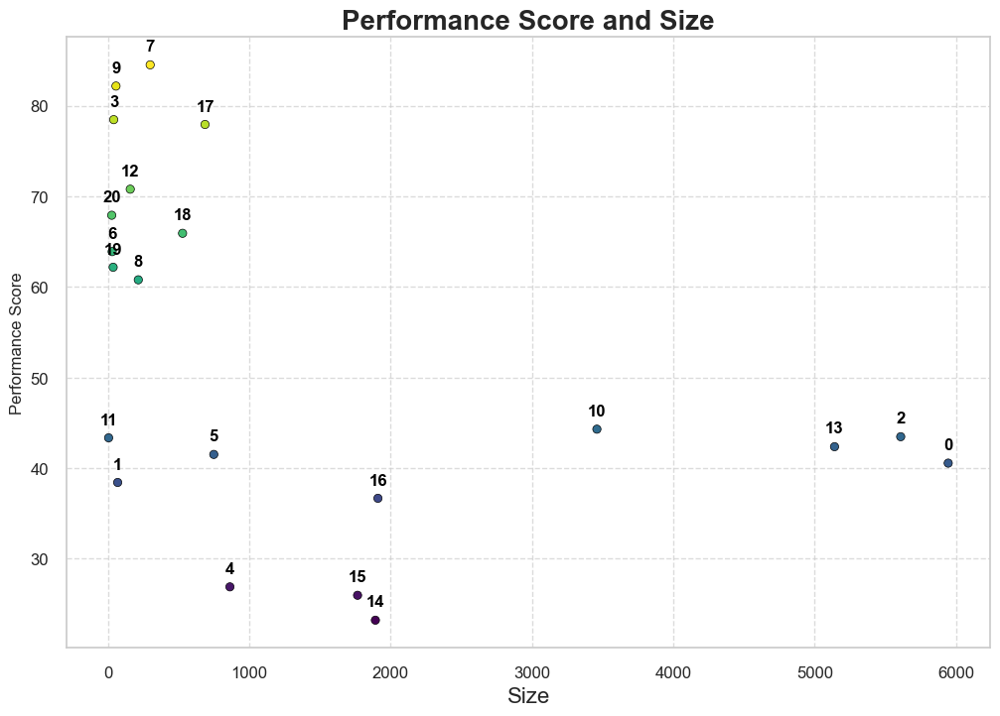

In [54]:
# Constructing the plot_df DataFrame GRAPH USED IN FIGURE 2A
plot_df = pd.DataFrame({
    'size': df_ranked['size'],
    'performance_score': df_ranked['performance_score']
}, index=df_ranked.index)  

sns.set(style="whitegrid")

plt.figure(figsize=(12, 8))


scatter_plot = sns.scatterplot(
    data=plot_df, 
    x='size',
    y='performance_score',
    hue='performance_score',  
    palette="viridis",  
    legend=False,  
    marker='o',  
    edgecolor='black'  
)

plt.title('Performance Score and Size', fontsize=20, fontweight='bold')
plt.xlabel('Size', fontsize=16)
plt.ylabel('Performance Score', fontsize=12)

plt.xticks(fontsize=12)
plt.yticks(fontsize=12)

plt.grid(True, linestyle='--', alpha=0.7)


for idx in plot_df.index:
    plt.annotate(
        str(idx),  
        (plot_df.loc[idx, 'size'], plot_df.loc[idx, 'performance_score']),
        textcoords="offset points",
        xytext=(0, 10),
        ha='center',
        fontsize=12,
        fontweight='bold',
        color='black'
    )

# Save the plot
output_dir = 'generated_df/TDABM_figures'
os.makedirs(output_dir, exist_ok=True)
plt.savefig(os.path.join(output_dir, 'performance_scoreSize.png'), bbox_inches='tight')

plt.show()

GRAPH USED IN FIGURE 2B

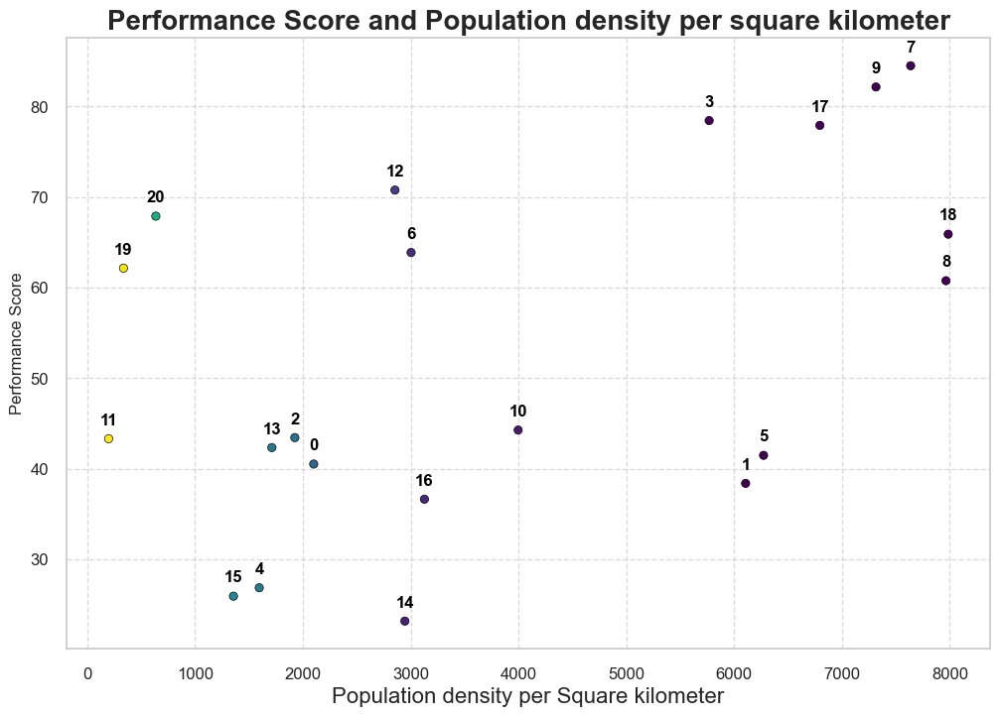

In [55]:
# Constructing the plot_df DataFrame GRAPH USED IN FIGURE 2B
plot_df = pd.DataFrame({
    'pop_density_sqrkilometer': ballmapper_means_df12['pop_density_sqrkilometer'],
    'performance_score': df_ranked['performance_score'],
    'ruralurban': df_ranked['rural_communites']
    
}, index=df_ranked.index)  

sns.set(style="whitegrid")

plt.figure(figsize=(12, 8))


scatter_plot = sns.scatterplot(
    data=plot_df, 
    x='pop_density_sqrkilometer',
    y='performance_score',
    hue='ruralurban',  
    palette="viridis",  
    legend=False,  
    marker='o',  
    edgecolor='black'  
)

plt.title('Performance Score and Population density per square kilometer', fontsize=20, fontweight='bold')
plt.xlabel('Population density per Square kilometer', fontsize=16)
plt.ylabel('Performance Score', fontsize=12)

plt.xticks(fontsize=12)
plt.yticks(fontsize=12)

plt.grid(True, linestyle='--', alpha=0.7)


for idx in plot_df.index:
    plt.annotate(
        str(idx),  
        (plot_df.loc[idx, 'pop_density_sqrkilometer'], plot_df.loc[idx, 'performance_score']),
        textcoords="offset points",
        xytext=(0, 10),
        ha='center',
        fontsize=12,
        fontweight='bold',
        color='black'
    )

# Save the plot
output_dir = 'generated_df/TDABM_figures'
os.makedirs(output_dir, exist_ok=True)
plt.savefig(os.path.join(output_dir, 'performance_scorepop_density_sqrkilometer.png'), bbox_inches='tight')

plt.show()

# STANDAR DEVIATION TABLE

TABLE USED IN ERP, TABLE 6 IN ERP

In [56]:
#TABLE USED IN ERP, TABLE 6 IN ERP

columns = [
    'pop_density_sqrkilometer','Pborn_Europe', 'total_population', 'Ptotal_populationF', 'Ptotal_populationM', 
    'PEconomicallyInactive', 'Pwhite', 'Pother_ethnic', 'Phousehold_notdeprived', 
    'Phousehold_deprived1D', 'PhouseOwned', 'PhouseSocialRented', 'PhousePrivateRented', 
    'P0to15_age', 'P16to49_age', 'P50over_age', 'Pborn_outsideEurope', 'Pinemployment', 
    'Punemployment', 'Phousehold_D2ormore', 'Presi_0toL1quali', 'Presi_L2toApprequali', 
    'Presi_L3toL4quali', 'PL1toL9_NS', 'PL10toL11_7_NS', 'PL12to13NS', 'PL14to15NS', 
    'air_score_ward', 'GP_unique_name_count', 'PH_unique_name_count', 'Uni_score_ward', 
    'PriS_unique_name_count','small_communities', 'rural_communites', 'majorityL3L4q', 
                'majorityP16to49_age', 'dnone50', 'GP_above1', 
                'VeryGoodhealth', 'PH_above1'
]

std = {}

for col in columns:
    std[col] = df_clusters.groupby('ball')[col].std()
    
ballmapper_std_df = pd.DataFrame(std)
ballmapper_std_df

ballmapper_std_df['size'] = size

ballmapper_std_df_transposed = ballmapper_std_df.T
ballmapper_std_df_transposed


ball,0,1,2,3,4,5,6,7,8,9,...,11,12,13,14,15,16,17,18,19,20
pop_density_sqrkilometer,0.677476,0.882563,0.650065,1.112007,0.527284,1.122258,0.634475,1.331953,1.269816,1.083701,...,0.091384,0.739727,0.575275,0.634098,0.479269,0.730212,1.467355,1.385089,0.237664,0.217916
Pborn_Europe,0.645398,1.041369,0.580495,0.720802,0.401375,1.292696,0.588628,0.887098,0.967200,1.043152,...,0.129240,0.697403,0.480807,0.618269,0.181950,1.010119,0.912686,0.935836,0.562752,0.535720
total_population,0.946204,1.090572,0.855824,1.260605,0.747706,0.948562,0.843350,0.856475,0.847186,1.031542,...,0.476530,0.889326,0.798988,0.823926,0.632929,0.851839,0.828774,0.809424,0.481859,0.588893
Ptotal_populationF,0.734918,1.402413,0.722426,1.689649,1.376790,0.917646,1.476321,1.214448,1.024584,1.365128,...,2.670205,1.384136,0.657654,0.750316,0.673641,0.769367,0.924846,0.943060,2.202262,1.363397
Ptotal_populationM,0.734915,1.402416,0.722428,1.689653,1.376793,0.917648,1.473261,1.214451,1.024586,1.365131,...,2.670211,1.384393,0.657648,0.750318,0.673643,0.769369,0.924848,0.943062,2.202267,1.363400
PEconomicallyInactive,0.850234,1.007886,0.862300,1.400245,0.723452,0.849674,1.008990,0.882892,1.021860,1.821877,...,0.555861,1.017523,0.846288,0.738167,0.680240,0.676739,0.853471,0.750570,1.495779,0.926396
Pwhite,0.718101,1.327904,0.577509,0.587261,0.347105,1.221132,0.528969,0.785702,1.049538,0.764395,...,0.233374,0.617737,0.480064,0.653126,0.172707,1.001724,0.848600,0.922635,0.328460,0.366544
Pother_ethnic,0.718142,1.328079,0.577508,0.587557,0.347096,1.221065,0.528304,0.785631,1.049104,0.764281,...,0.233455,0.618528,0.480088,0.653116,0.172866,1.001691,0.848576,0.922630,0.329411,0.366563
Phousehold_notdeprived,0.912741,0.714613,0.821805,0.913669,0.681951,0.696560,0.863991,0.729836,0.785885,0.739081,...,0.604647,0.758051,0.799254,0.625260,0.670518,0.714284,0.790965,0.797468,0.411540,0.506901
Phousehold_deprived1D,0.863470,0.597091,0.936460,1.011004,0.738392,0.630576,0.970475,0.922481,0.766879,1.033113,...,0.673593,0.898812,0.915438,0.618967,0.654940,0.753697,0.917836,0.965131,0.691217,0.756455


In [57]:
df_excluding_last = ballmapper_std_df_transposed.iloc[:-1]

last_8_rows = df_excluding_last.iloc[-8:]

column_means_last_8 = last_8_rows.mean()


new_row = pd.DataFrame([column_means_last_8], index=['average_of_dummy_variables'])

ballmapper_std_df_transposed = pd.concat([ballmapper_std_df_transposed, new_row])

print(ballmapper_std_df_transposed)

ball                                 0          1            2          3   \
pop_density_sqrkilometer       0.677476   0.882563     0.650065   1.112007   
Pborn_Europe                   0.645398   1.041369     0.580495   0.720802   
total_population               0.946204   1.090572     0.855824   1.260605   
Ptotal_populationF             0.734918   1.402413     0.722426   1.689649   
Ptotal_populationM             0.734915   1.402416     0.722428   1.689653   
PEconomicallyInactive          0.850234   1.007886     0.862300   1.400245   
Pwhite                         0.718101   1.327904     0.577509   0.587261   
Pother_ethnic                  0.718142   1.328079     0.577508   0.587557   
Phousehold_notdeprived         0.912741   0.714613     0.821805   0.913669   
Phousehold_deprived1D          0.863470   0.597091     0.936460   1.011004   
PhouseOwned                    0.840548   0.645506     0.700207   1.201690   
PhouseSocialRented             0.929315   1.014754     0.741603 

In [58]:
ballmapper_std_df= ballmapper_std_df_transposed.T
ballmapper_std_df

,pop_density_sqrkilometer,Pborn_Europe,total_population,Ptotal_populationF,Ptotal_populationM,PEconomicallyInactive,Pwhite,Pother_ethnic,Phousehold_notdeprived,Phousehold_deprived1D,...,small_communities,rural_communites,majorityL3L4q,majorityP16to49_age,dnone50,GP_above1,VeryGoodhealth,PH_above1,size,average_of_dummy_variables
ball,,,,,,,,,,,,,,,,,,,,,
0,0.677476,0.645398,0.946204,0.734918,0.734915,0.850234,0.718101,0.718142,0.912741,0.863470,...,0.441892,0.443570,0.496194,0.216148,0.499852,0.497471,0.447261,0.482330,5944.0,0.440590
1,0.882563,1.041369,1.090572,1.402413,1.402416,1.007886,1.327904,1.328079,0.714613,0.597091,...,0.168995,0.000000,0.499360,0.415493,0.000000,0.499360,0.393901,0.502339,69.0,0.309931
2,0.650065,0.580495,0.855824,0.722426,0.722428,0.862300,0.577509,0.577508,0.821805,0.936460,...,0.451005,0.455814,0.499866,0.220014,0.493329,0.499804,0.475714,0.489971,5608.0,0.448190
3,1.112007,0.720802,1.260605,1.689649,1.689653,1.400245,0.587261,0.587557,0.913669,1.011004,...,0.218085,0.000000,0.000000,0.000000,0.506061,0.487652,0.300406,0.480091,41.0,0.249037
4,0.527284,0.401375,0.747706,1.376790,1.376793,0.723452,0.347105,0.347096,0.681951,0.738392,...,0.473424,0.470153,0.349792,0.215297,0.410621,0.496987,0.227057,0.491061,863.0,0.391799
5,1.122258,1.292696,0.948562,0.917646,0.917648,0.849674,1.221132,1.221065,0.696560,0.630576,...,0.130683,0.000000,0.461028,0.481982,0.157343,0.459893,0.467465,0.418279,749.0,0.322084
6,0.634475,0.588628,0.843350,1.476321,1.473261,1.008990,0.528969,0.528304,0.863991,0.970475,...,0.345746,0.305129,0.000000,0.379049,0.508548,0.508548,0.507416,0.507416,30.0,0.382731
7,1.331953,0.887098,0.856475,1.214448,1.214451,0.882892,0.785702,0.785631,0.729836,0.922481,...,0.057831,0.057831,0.180096,0.344555,0.460902,0.358162,0.382527,0.333632,299.0,0.271942
8,1.269816,0.967200,0.847186,1.024584,1.024586,1.021860,1.049538,1.049104,0.785885,0.766879,...,0.000000,0.000000,0.500901,0.449589,0.200738,0.238903,0.499946,0.189716,215.0,0.259974


Information used for table 1

In [59]:
ballmapper_std_df['average_of_dummy_variables'].describe()

count    21.000000
mean      0.352116
std       0.070883
min       0.207052
25%       0.309931
50%       0.363388
75%       0.411344
max       0.448190
Name: average_of_dummy_variables, dtype: float64

In [60]:
csv_file_path = 'generated_df/TDABM_tables/standarizedballmapper_std_df.csv'
ballmapper_std_df_transposed.to_csv(csv_file_path, index=True)

In [61]:
latex_code = ballmapper_std_df_transposed.to_latex(index=True, caption='Ballmapper nodes standar deviation with standarized data', label='tab:tdabm_std_standardata')

output_folder = 'generated_df/TDABM_tables'
output_filename = os.path.join(output_folder, 'tdabm_std_standardata.tex')

os.makedirs(output_folder, exist_ok=True)

with open(output_filename, 'w') as file:
    file.write(latex_code)

print(f"LaTeX table saved to {output_filename}")

LaTeX table saved to generated_df/TDABM_tables/tdabm_std_standardata.tex


/var/folders/r0/53lbrfvx4kd2t6dzcz18qbhr0000gn/T/ipykernel_51305/3669277963.py:1: FutureWarning: In future versions `DataFrame.to_latex` is expected to utilise the base implementation of `Styler.to_latex` for formatting and rendering. The arguments signature may therefore change. It is recommended instead to use `DataFrame.style.to_latex` which also contains additional functionality.
  latex_code = ballmapper_std_df_transposed.to_latex(index=True, caption='Ballmapper nodes standar deviation with standarized data', label='tab:tdabm_std_standardata')


In [62]:
df = ballmapper_std_df_transposed.T 


Figure 9A

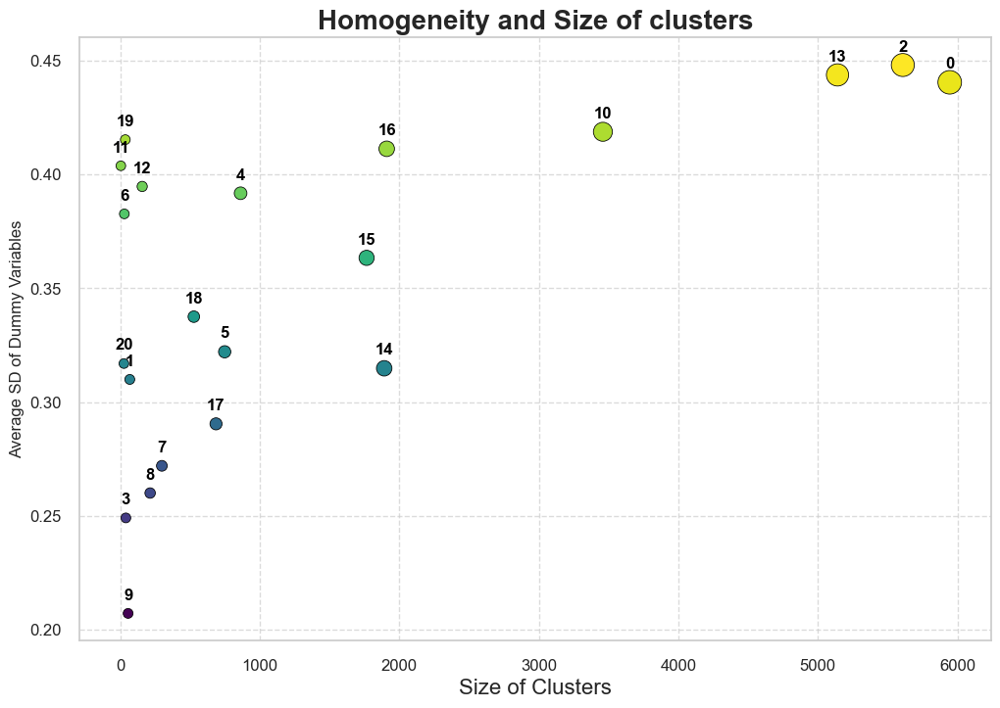

In [63]:

size = ballmapper_std_df_transposed.loc['size'].values
average_of_dummy_variables = ballmapper_std_df_transposed.loc['average_of_dummy_variables'].values

plot_df = pd.DataFrame({
    'size': size,
    'average_of_dummy_variables': average_of_dummy_variables
})

sns.set(style="whitegrid")

plt.figure(figsize=(12, 8))

sns.scatterplot(
    data=plot_df, 
    x='size', 
    y='average_of_dummy_variables', 
    hue='average_of_dummy_variables',  
    palette="viridis",  
    size='size',  
    sizes=(50, 300),  
    legend=False,  
    marker='o',  
    edgecolor='black'  
)

plt.title('Homogeneity and Size of clusters', fontsize=20, fontweight='bold')
plt.xlabel('Size of Clusters', fontsize=16)
plt.ylabel('Average SD of Dummy Variables', fontsize=12)

plt.xticks(fontsize=12)
plt.yticks(fontsize=12)

plt.grid(True, linestyle='--', alpha=0.7)

for i in range(len(plot_df)):
    plt.annotate(
        str(i),  
        (plot_df['size'][i], plot_df['average_of_dummy_variables'][i]),  
        textcoords="offset points",  
        xytext=(0, 10),  
        ha='center', 
        fontsize=12,  
        fontweight='bold',  
        color='black'  
    )

    output_dir = 'generated_df/TDABM_figures'
    os.makedirs(output_dir, exist_ok=True)
    
    plt.savefig(os.path.join(output_dir, 'Size_averageSD.png'), bbox_inches='tight')

plt.show()

Graph 9b

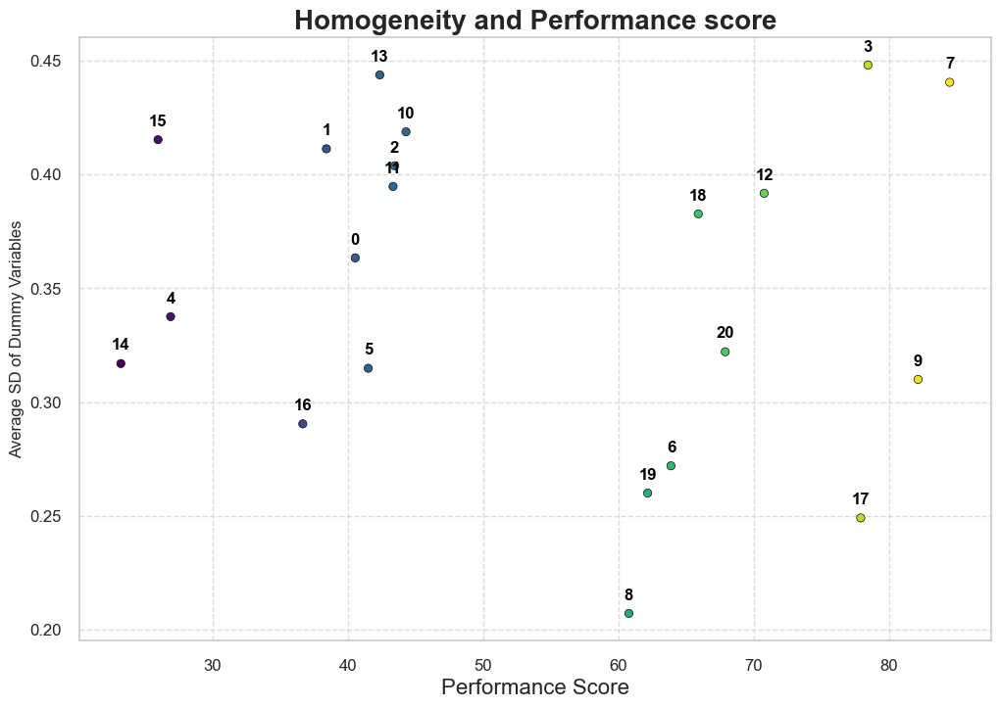

In [64]:
average_of_dummy_variables = ballmapper_std_df_transposed.loc['average_of_dummy_variables'].values


plot_df = pd.DataFrame({
    'performance_score': df_ranked['performance_score'],
    'average_of_dummy_variables': average_of_dummy_variables
}, index=df_ranked.index)  

sns.set(style="whitegrid")

plt.figure(figsize=(12, 8))

# Creating the scatter plot
scatter_plot = sns.scatterplot(
    data=plot_df, 
    x='performance_score',
    y='average_of_dummy_variables',
    hue='performance_score',  
    palette="viridis",  
    legend=False,  
    marker='o',  
    edgecolor='black'  
)

plt.title('Homogeneity and Performance score', fontsize=20, fontweight='bold')
plt.xlabel('Performance Score', fontsize=16)
plt.ylabel('Average SD of Dummy Variables', fontsize=12)

plt.xticks(fontsize=12)
plt.yticks(fontsize=12)

plt.grid(True, linestyle='--', alpha=0.7)


for idx in plot_df.index:
    plt.annotate(
        str(idx),  
        (plot_df.loc[idx, 'performance_score'], plot_df.loc[idx, 'average_of_dummy_variables']),
        textcoords="offset points",
        xytext=(0, 10),
        ha='center',
        fontsize=12,
        fontweight='bold',
        color='black'
    )


output_dir = 'generated_df/TDABM_figures'
os.makedirs(output_dir, exist_ok=True)
plt.savefig(os.path.join(output_dir, 'Homogeneity_andperformance.png'), bbox_inches='tight')

plt.show()

 GRAPH 12.A

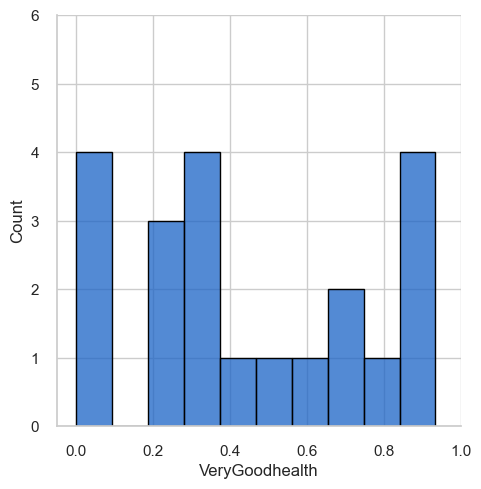

In [65]:
sns.displot(ballmapper_means_df12['VeryGoodhealth'],bins=10, color='#1a63c6', edgecolor='black')
plt.ylim(0, 6)
plt.xlim(-0.05, 1)

plt.savefig('generated_df/TDABM_figures/TDABMvghdist.png', dpi=300)


plt.show()

In [66]:
df_clusters_notstandarized= dfWD.reset_index()

In [67]:
df_clusters_notstandarized

,index,wardcode,ward,Local_Authority_D,pop_density_sqrkilometer,Pborn_Europe,total_population,Ptotal_populationF,Ptotal_populationM,PEconomicallyInactive,...,small_communities,rural_communites,majorityL3L4q,majorityP16to49_age,dnone50,GP_above1,VeryGoodhealth,PH_above1,point,ball
0,0,E05013038,Burn Valley,Hartlepool,2895.6,97.1,7631,51.3,48.7,48.6,...,0,0,0,0,0,1,0,1,0,0
1,1,E05013039,De Bruce,Hartlepool,2722.9,98.4,8055,52.4,47.6,49.2,...,0,0,0,0,0,1,0,1,1,0
2,2,E05013040,Fens & Greatham,Hartlepool,331.5,98.8,6380,52.1,47.9,47.3,...,0,0,0,0,0,1,0,1,2,0
3,3,E05013040,Fens & Greatham,Hartlepool,331.5,98.8,6380,52.1,47.9,47.3,...,0,0,0,0,0,1,0,1,2,2
4,4,E05013040,Fens & Greatham,Hartlepool,331.5,98.8,6380,52.1,47.9,47.3,...,0,0,0,0,0,1,0,1,2,13
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29479,29479,E05014387,Wellington (Somerset West and Taunton),NaN,1806.5,96.0,13040,51.3,48.7,40.6,...,0,0,0,0,0,0,0,0,6875,10
29480,29480,E05014387,Wellington (Somerset West and Taunton),NaN,1806.5,96.0,13040,51.3,48.7,40.6,...,0,0,0,0,0,0,0,0,6875,13
29481,29481,E05014387,Wellington (Somerset West and Taunton),NaN,1806.5,96.0,13040,51.3,48.7,40.6,...,0,0,0,0,0,0,0,0,6875,14
29482,29482,E05014387,Wellington (Somerset West and Taunton),NaN,1806.5,96.0,13040,51.3,48.7,40.6,...,0,0,0,0,0,0,0,0,6875,15


# Export Balls and create new DF for each

In [68]:
unique_ball_values = df_clusters_notstandarized['ball'].unique()

output_dir = 'generated_df/TDAballs'
os.makedirs(output_dir, exist_ok=True)

for value in unique_ball_values:
    filtered_df = df_clusters_notstandarized[df_clusters['ball'] == value]
    
    filename = f'filtered_data_ball_{value}.csv'
    filepath = os.path.join(output_dir, filename)
    
    filtered_df.to_csv(filepath, index=False)

    print(f'Saved {filename} in {output_dir}')


Saved filtered_data_ball_0.csv in generated_df/TDAballs
Saved filtered_data_ball_2.csv in generated_df/TDAballs
Saved filtered_data_ball_13.csv in generated_df/TDAballs
Saved filtered_data_ball_15.csv in generated_df/TDAballs
Saved filtered_data_ball_4.csv in generated_df/TDAballs
Saved filtered_data_ball_10.csv in generated_df/TDAballs
Saved filtered_data_ball_14.csv in generated_df/TDAballs
Saved filtered_data_ball_5.csv in generated_df/TDAballs
Saved filtered_data_ball_16.csv in generated_df/TDAballs
Saved filtered_data_ball_1.csv in generated_df/TDAballs
Saved filtered_data_ball_12.csv in generated_df/TDAballs
Saved filtered_data_ball_3.csv in generated_df/TDAballs
Saved filtered_data_ball_8.csv in generated_df/TDAballs
Saved filtered_data_ball_18.csv in generated_df/TDAballs
Saved filtered_data_ball_7.csv in generated_df/TDAballs
Saved filtered_data_ball_17.csv in generated_df/TDAballs
Saved filtered_data_ball_9.csv in generated_df/TDAballs
Saved filtered_data_ball_20.csv in gener

In [69]:
df_ball_0 = pd.read_csv('generated_df/TDAballs/filtered_data_ball_0.csv')
df_ball_1 = pd.read_csv('generated_df/TDAballs/filtered_data_ball_1.csv')
df_ball_2 = pd.read_csv('generated_df/TDAballs/filtered_data_ball_2.csv')
df_ball_3 = pd.read_csv('generated_df/TDAballs/filtered_data_ball_3.csv')
df_ball_4 = pd.read_csv('generated_df/TDAballs/filtered_data_ball_4.csv')
df_ball_5 = pd.read_csv('generated_df/TDAballs/filtered_data_ball_5.csv')
df_ball_6 = pd.read_csv('generated_df/TDAballs/filtered_data_ball_6.csv')
df_ball_7 = pd.read_csv('generated_df/TDAballs/filtered_data_ball_7.csv')
df_ball_8 = pd.read_csv('generated_df/TDAballs/filtered_data_ball_8.csv')
df_ball_9 = pd.read_csv('generated_df/TDAballs/filtered_data_ball_9.csv')
df_ball_10 = pd.read_csv('generated_df/TDAballs/filtered_data_ball_10.csv')
df_ball_11 = pd.read_csv('generated_df/TDAballs/filtered_data_ball_11.csv')
df_ball_12 = pd.read_csv('generated_df/TDAballs/filtered_data_ball_12.csv')
df_ball_13 = pd.read_csv('generated_df/TDAballs/filtered_data_ball_13.csv')
df_ball_14 = pd.read_csv('generated_df/TDAballs/filtered_data_ball_14.csv')
df_ball_15 = pd.read_csv('generated_df/TDAballs/filtered_data_ball_15.csv')
df_ball_16 = pd.read_csv('generated_df/TDAballs/filtered_data_ball_16.csv')
df_ball_17 = pd.read_csv('generated_df/TDAballs/filtered_data_ball_17.csv')
df_ball_18 = pd.read_csv('generated_df/TDAballs/filtered_data_ball_18.csv')
df_ball_19 = pd.read_csv('generated_df/TDAballs/filtered_data_ball_19.csv')
df_ball_20 = pd.read_csv('generated_df/TDAballs/filtered_data_ball_20.csv')



Map each ball 

Original Bounds: minx=332390.20210000034, maxx=390350.2030999996, miny=379748.4975000005, maxy=405357.59699999914
Expanded and Adjusted Bounds: minx=303410.2016000007, maxx=419330.2035999992, miny=341334.8482500026, maxy=443771.24624999706


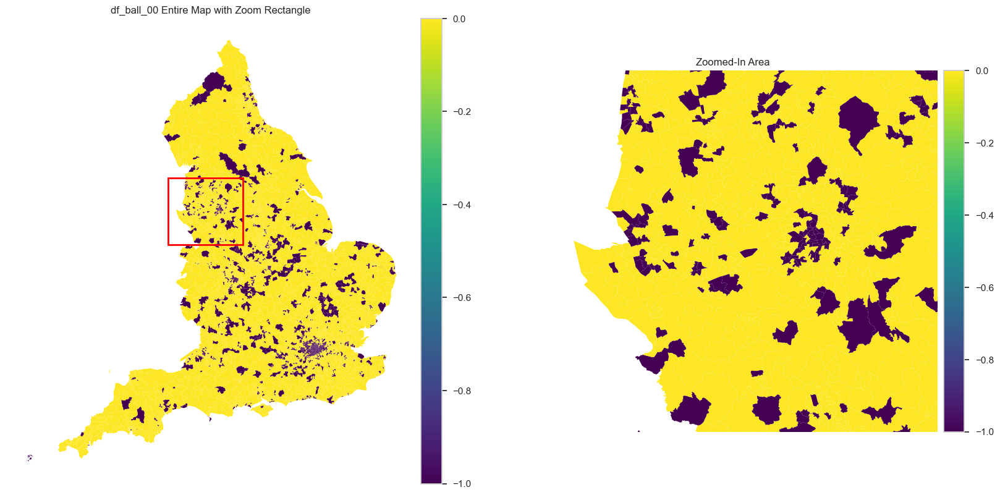

In [70]:
df_ball_00 = pd.merge(uk_shape, df_ball_0, on=['ward', 'wardcode'], how='left')

df_ball_00['ball'].fillna(-1, inplace=True)
df_ball_00



wards_of_interest = [
     'Liverpool', 'Manchester'
]

filtered_merge_u = df_ball_00[df_ball_00['Local_Authority_D_x'].isin(wards_of_interest)]  

if filtered_merge_u.empty:
    print("No data found for the specified wards.")
else:
    minx, miny, maxx, maxy = filtered_merge_u.total_bounds

    print(f"Original Bounds: minx={minx}, maxx={maxx}, miny={miny}, maxy={maxy}")

    width = maxx - minx
    height = maxy - miny

    expanded_width = width * 2
    expanded_height = height * 4


    center_x = (minx + maxx) / 2
    center_y = (miny + maxy) / 2

    new_minx = center_x - expanded_width / 2
    new_maxx = center_x + expanded_width / 2
    new_miny = (center_y - expanded_height / 2) 
    new_maxy = (center_y + expanded_height / 2) 

    print(f"Expanded and Adjusted Bounds: minx={new_minx}, maxx={new_maxx}, miny={new_miny}, maxy={new_maxy}")



    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))

    ax1.set_title("df_ball_00 Entire Map with Zoom Rectangle")
    ax1.set_axis_off()
    divider1 = make_axes_locatable(ax1)
    cax1 = divider1.append_axes("right", size="5%", pad=0.1)
    df_ball_00.plot(column="ball", ax=ax1, legend=True, cax=cax1, cmap='viridis', edgecolor='none')

    rect = patches.Rectangle((new_minx, new_miny), expanded_width, expanded_height, linewidth=2, edgecolor='red', facecolor='none')
    ax1.add_patch(rect)

    ax2.set_title("Zoomed-In Area")
    ax2.set_axis_off()
    divider2 = make_axes_locatable(ax2)
    cax2 = divider2.append_axes("right", size="5%", pad=0.1)
    df_ball_00.plot(column="ball", ax=ax2, legend=True, cax=cax2, cmap='viridis', edgecolor='none')

    ax2.set_xlim(new_minx, new_maxx)
    ax2.set_ylim(new_miny, new_maxy)
    
    output_dir = 'generated_df/TDABM_figures'
    os.makedirs(output_dir, exist_ok=True)
    
    plt.savefig(os.path.join(output_dir, 'ball0_mapTDABM.png'), bbox_inches='tight')

    plt.show()


Original Bounds: minx=332390.20210000034, maxx=390350.2030999996, miny=379748.4975000005, maxy=405357.59699999914
Expanded and Adjusted Bounds: minx=303410.2016000007, maxx=419330.2035999992, miny=341334.8482500026, maxy=443771.24624999706


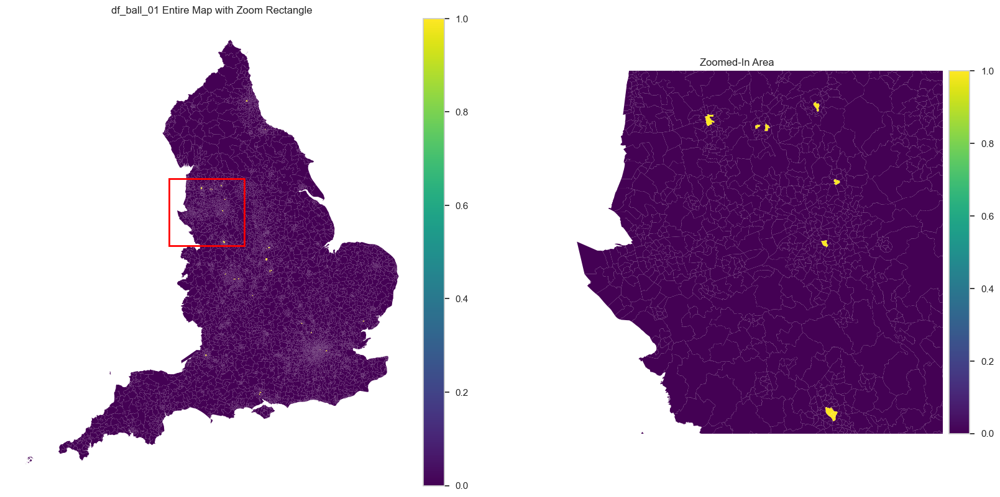

In [71]:
df_ball_01 = pd.merge(uk_shape, df_ball_1, on=['ward', 'wardcode'], how='left')

df_ball_01['ball'].fillna(0, inplace=True)

filtered_merge_u = df_ball_01[df_ball_01['Local_Authority_D_x'].isin(wards_of_interest)]  

if filtered_merge_u.empty:
    print("No data found for the specified wards.")
else:
    minx, miny, maxx, maxy = filtered_merge_u.total_bounds

    print(f"Original Bounds: minx={minx}, maxx={maxx}, miny={miny}, maxy={maxy}")

    width = maxx - minx
    height = maxy - miny

    expanded_width = width * 2
    expanded_height = height * 4

    center_x = (minx + maxx) / 2
    center_y = (miny + maxy) / 2

    new_minx = center_x - expanded_width / 2
    new_maxx = center_x + expanded_width / 2
    new_miny = (center_y - expanded_height / 2) 
    new_maxy = (center_y + expanded_height / 2) 

    print(f"Expanded and Adjusted Bounds: minx={new_minx}, maxx={new_maxx}, miny={new_miny}, maxy={new_maxy}")



    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))

    ax1.set_title("df_ball_01 Entire Map with Zoom Rectangle")
    ax1.set_axis_off()
    divider1 = make_axes_locatable(ax1)
    cax1 = divider1.append_axes("right", size="5%", pad=0.1)
    df_ball_01.plot(column="ball", ax=ax1, legend=True, cax=cax1, cmap='viridis', edgecolor='none')

    rect = patches.Rectangle((new_minx, new_miny), expanded_width, expanded_height, linewidth=2, edgecolor='red', facecolor='none')
    ax1.add_patch(rect)

    ax2.set_title("Zoomed-In Area")
    ax2.set_axis_off()
    divider2 = make_axes_locatable(ax2)
    cax2 = divider2.append_axes("right", size="5%", pad=0.1)
    df_ball_01.plot(column="ball", ax=ax2, legend=True, cax=cax2, cmap='viridis', edgecolor='none')

    ax2.set_xlim(new_minx, new_maxx)
    ax2.set_ylim(new_miny, new_maxy)
    
    output_dir = 'generated_df/TDABM_figures'
    os.makedirs(output_dir, exist_ok=True)
    
    plt.savefig(os.path.join(output_dir, 'ball1_mapTDABM.png'), bbox_inches='tight')

    
    plt.show()



Original Bounds: minx=332390.20210000034, maxx=390350.2030999996, miny=379748.4975000005, maxy=405357.59699999914
Expanded and Adjusted Bounds: minx=303410.2016000007, maxx=419330.2035999992, miny=341334.8482500026, maxy=443771.24624999706


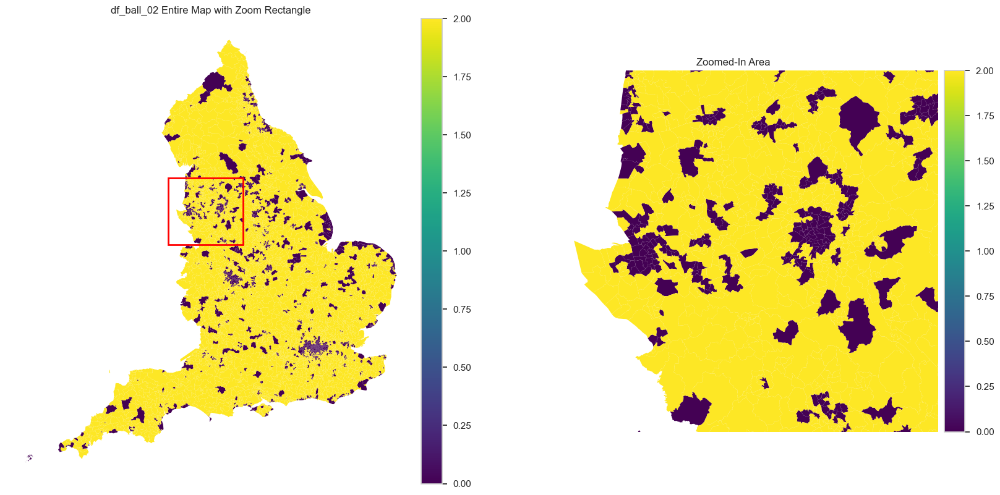

In [72]:
df_ball_02 = pd.merge(uk_shape, df_ball_2, on=['ward', 'wardcode'], how='left')

df_ball_02['ball'].fillna(0, inplace=True)


filtered_merge_u = df_ball_02[df_ball_02['Local_Authority_D_x'].isin(wards_of_interest)]


if filtered_merge_u.empty:
    print("No data found for the specified wards.")
else:
    minx, miny, maxx, maxy = filtered_merge_u.total_bounds

    print(f"Original Bounds: minx={minx}, maxx={maxx}, miny={miny}, maxy={maxy}")

    width = maxx - minx
    height = maxy - miny

    expanded_width = width * 2
    expanded_height = height * 4


    center_x = (minx + maxx) / 2
    center_y = (miny + maxy) / 2

    new_minx = center_x - expanded_width / 2
    new_maxx = center_x + expanded_width / 2
    new_miny = (center_y - expanded_height / 2) 
    new_maxy = (center_y + expanded_height / 2) 

    print(f"Expanded and Adjusted Bounds: minx={new_minx}, maxx={new_maxx}, miny={new_miny}, maxy={new_maxy}")



    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))

    ax1.set_title("df_ball_02 Entire Map with Zoom Rectangle")
    ax1.set_axis_off()
    divider1 = make_axes_locatable(ax1)
    cax1 = divider1.append_axes("right", size="5%", pad=0.1)
    df_ball_02.plot(column="ball", ax=ax1, legend=True, cax=cax1, cmap='viridis', edgecolor='none')

    rect = patches.Rectangle((new_minx, new_miny), expanded_width, expanded_height, linewidth=2, edgecolor='red', facecolor='none')
    ax1.add_patch(rect)

    ax2.set_title("Zoomed-In Area")
    ax2.set_axis_off()
    divider2 = make_axes_locatable(ax2)
    cax2 = divider2.append_axes("right", size="5%", pad=0.1)
    df_ball_02.plot(column="ball", ax=ax2, legend=True, cax=cax2, cmap='viridis', edgecolor='none')

    ax2.set_xlim(new_minx, new_maxx)
    ax2.set_ylim(new_miny, new_maxy)

    output_dir = 'generated_df/TDABM_figures'
    os.makedirs(output_dir, exist_ok=True)
    
    plt.savefig(os.path.join(output_dir, 'ball2_mapTDABM.png'), bbox_inches='tight')

    
    plt.show()

Original Bounds: minx=332390.20210000034, maxx=390350.2030999996, miny=379748.4975000005, maxy=405357.59699999914
Expanded and Adjusted Bounds: minx=303410.2016000007, maxx=419330.2035999992, miny=341334.8482500026, maxy=443771.24624999706


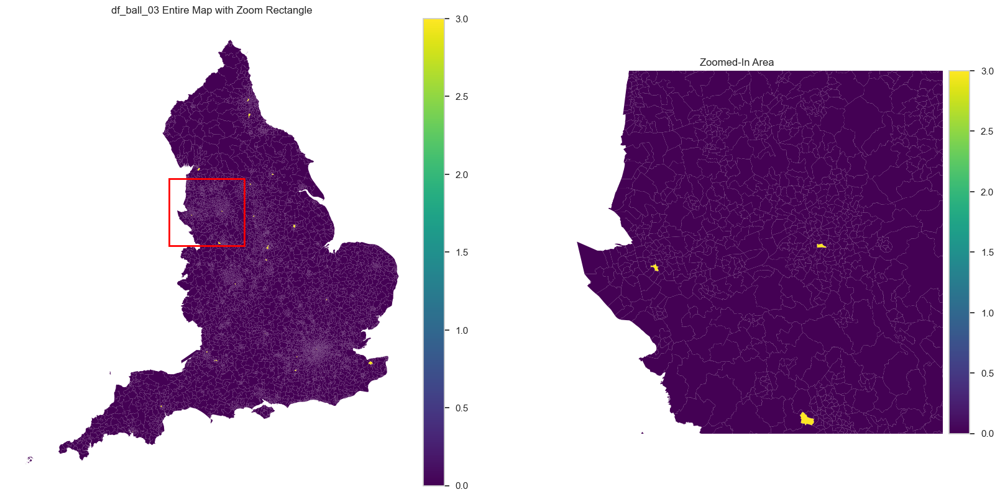

In [73]:
df_ball_03 = pd.merge(uk_shape, df_ball_3, on=['ward', 'wardcode'], how='left')

df_ball_03['ball'].fillna(0, inplace=True)

filtered_merge_u = df_ball_03[df_ball_03['Local_Authority_D_x'].isin(wards_of_interest)]  

if filtered_merge_u.empty:
    print("No data found for the specified wards.")
else:
    minx, miny, maxx, maxy = filtered_merge_u.total_bounds

    print(f"Original Bounds: minx={minx}, maxx={maxx}, miny={miny}, maxy={maxy}")

    width = maxx - minx
    height = maxy - miny

    expanded_width = width * 2
    expanded_height = height * 4

    center_x = (minx + maxx) / 2
    center_y = (miny + maxy) / 2

    new_minx = center_x - expanded_width / 2
    new_maxx = center_x + expanded_width / 2
    new_miny = (center_y - expanded_height / 2) 
    new_maxy = (center_y + expanded_height / 2) 

    print(f"Expanded and Adjusted Bounds: minx={new_minx}, maxx={new_maxx}, miny={new_miny}, maxy={new_maxy}")



    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))

    ax1.set_title("df_ball_03 Entire Map with Zoom Rectangle")
    ax1.set_axis_off()
    divider1 = make_axes_locatable(ax1)
    cax1 = divider1.append_axes("right", size="5%", pad=0.1)
    df_ball_03.plot(column="ball", ax=ax1, legend=True, cax=cax1, cmap='viridis', edgecolor='none')

    rect = patches.Rectangle((new_minx, new_miny), expanded_width, expanded_height, linewidth=2, edgecolor='red', facecolor='none')
    ax1.add_patch(rect)

    ax2.set_title("Zoomed-In Area")
    ax2.set_axis_off()
    divider2 = make_axes_locatable(ax2)
    cax2 = divider2.append_axes("right", size="5%", pad=0.1)
    df_ball_03.plot(column="ball", ax=ax2, legend=True, cax=cax2, cmap='viridis', edgecolor='none')

    ax2.set_xlim(new_minx, new_maxx)
    ax2.set_ylim(new_miny, new_maxy)

    output_dir = 'generated_df/TDABM_figures'
    os.makedirs(output_dir, exist_ok=True)
    
    plt.savefig(os.path.join(output_dir, 'ball3_mapTDABM.png'), bbox_inches='tight')

    
    plt.show()

Original Bounds: minx=332390.20210000034, maxx=390350.2030999996, miny=379748.4975000005, maxy=405357.59699999914
Expanded and Adjusted Bounds: minx=303410.2016000007, maxx=419330.2035999992, miny=341334.8482500026, maxy=443771.24624999706


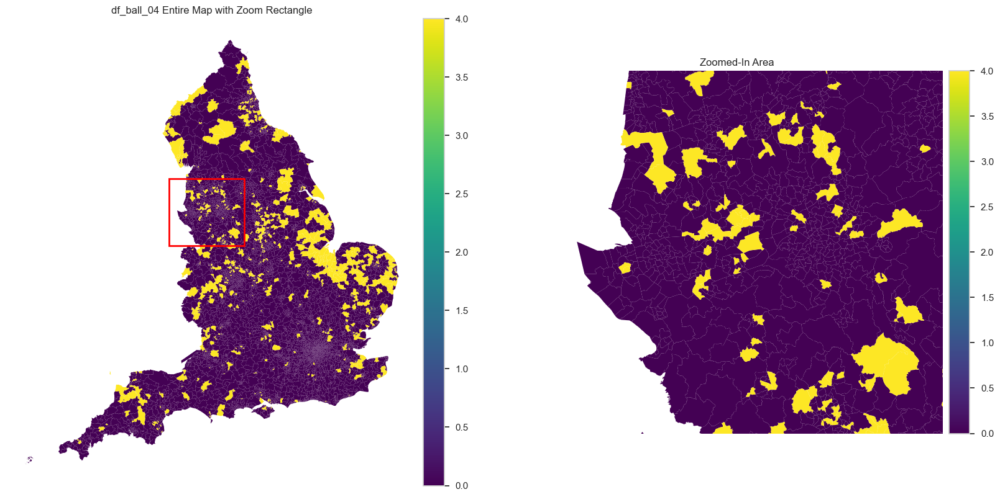

In [74]:
df_ball_04 = pd.merge(uk_shape, df_ball_4, on=['ward', 'wardcode'], how='left')

df_ball_04['ball'].fillna(0, inplace=True)

filtered_merge_u = df_ball_04[df_ball_04['Local_Authority_D_x'].isin(wards_of_interest)]  


if filtered_merge_u.empty:
    print("No data found for the specified wards.")
else:
    minx, miny, maxx, maxy = filtered_merge_u.total_bounds

    print(f"Original Bounds: minx={minx}, maxx={maxx}, miny={miny}, maxy={maxy}")

    width = maxx - minx
    height = maxy - miny

    expanded_width = width * 2
    expanded_height = height * 4

    center_x = (minx + maxx) / 2
    center_y = (miny + maxy) / 2

    new_minx = center_x - expanded_width / 2
    new_maxx = center_x + expanded_width / 2
    new_miny = (center_y - expanded_height / 2) 
    new_maxy = (center_y + expanded_height / 2) 

    print(f"Expanded and Adjusted Bounds: minx={new_minx}, maxx={new_maxx}, miny={new_miny}, maxy={new_maxy}")



    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))

    ax1.set_title("df_ball_04 Entire Map with Zoom Rectangle")
    ax1.set_axis_off()
    divider1 = make_axes_locatable(ax1)
    cax1 = divider1.append_axes("right", size="5%", pad=0.1)
    df_ball_04.plot(column="ball", ax=ax1, legend=True, cax=cax1, cmap='viridis', edgecolor='none')

    rect = patches.Rectangle((new_minx, new_miny), expanded_width, expanded_height, linewidth=2, edgecolor='red', facecolor='none')
    ax1.add_patch(rect)

    ax2.set_title("Zoomed-In Area")
    ax2.set_axis_off()
    divider2 = make_axes_locatable(ax2)
    cax2 = divider2.append_axes("right", size="5%", pad=0.1)
    df_ball_04.plot(column="ball", ax=ax2, legend=True, cax=cax2, cmap='viridis', edgecolor='none')

    ax2.set_xlim(new_minx, new_maxx)
    ax2.set_ylim(new_miny, new_maxy)

    output_dir = 'generated_df/TDABM_figures'
    os.makedirs(output_dir, exist_ok=True)
    
    plt.savefig(os.path.join(output_dir, 'ball4_mapTDABM.png'), bbox_inches='tight')

    
    plt.show()

Original Bounds: minx=332390.20210000034, maxx=390350.2030999996, miny=379748.4975000005, maxy=405357.59699999914
Expanded and Adjusted Bounds: minx=303410.2016000007, maxx=419330.2035999992, miny=341334.8482500026, maxy=443771.24624999706


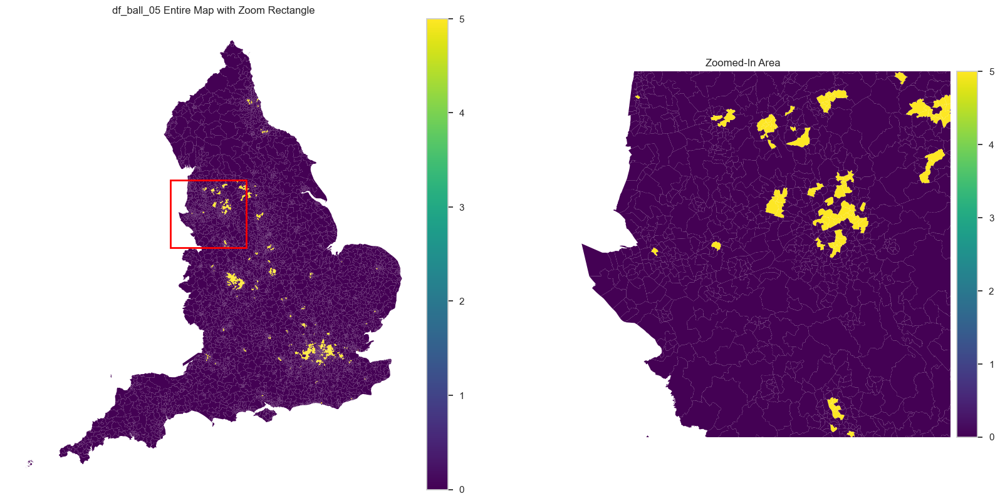

In [75]:
df_ball_05 = pd.merge(uk_shape, df_ball_5, on=['ward', 'wardcode'], how='left')

df_ball_05['ball'].fillna(0, inplace=True)

filtered_merge_u = df_ball_05[df_ball_05['Local_Authority_D_x'].isin(wards_of_interest)] 


if filtered_merge_u.empty:
    print("No data found for the specified wards.")
else:
    minx, miny, maxx, maxy = filtered_merge_u.total_bounds

    print(f"Original Bounds: minx={minx}, maxx={maxx}, miny={miny}, maxy={maxy}")

    width = maxx - minx
    height = maxy - miny

    expanded_width = width * 2
    expanded_height = height * 4

    center_x = (minx + maxx) / 2
    center_y = (miny + maxy) / 2

    new_minx = center_x - expanded_width / 2
    new_maxx = center_x + expanded_width / 2
    new_miny = (center_y - expanded_height / 2) 
    new_maxy = (center_y + expanded_height / 2) 

    print(f"Expanded and Adjusted Bounds: minx={new_minx}, maxx={new_maxx}, miny={new_miny}, maxy={new_maxy}")



    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))

    ax1.set_title("df_ball_05 Entire Map with Zoom Rectangle")
    ax1.set_axis_off()
    divider1 = make_axes_locatable(ax1)
    cax1 = divider1.append_axes("right", size="5%", pad=0.1)
    df_ball_05.plot(column="ball", ax=ax1, legend=True, cax=cax1, cmap='viridis', edgecolor='none')

    rect = patches.Rectangle((new_minx, new_miny), expanded_width, expanded_height, linewidth=2, edgecolor='red', facecolor='none')
    ax1.add_patch(rect)

    ax2.set_title("Zoomed-In Area")
    ax2.set_axis_off()
    divider2 = make_axes_locatable(ax2)
    cax2 = divider2.append_axes("right", size="5%", pad=0.1)
    df_ball_05.plot(column="ball", ax=ax2, legend=True, cax=cax2, cmap='viridis', edgecolor='none')

    ax2.set_xlim(new_minx, new_maxx)
    ax2.set_ylim(new_miny, new_maxy)

    output_dir = 'generated_df/TDABM_figures'
    os.makedirs(output_dir, exist_ok=True)
    
    plt.savefig(os.path.join(output_dir, 'ball5_mapTDABM.png'), bbox_inches='tight')

    
    plt.show()

Original Bounds: minx=332390.20210000034, maxx=390350.2030999996, miny=379748.4975000005, maxy=405357.59699999914
Expanded and Adjusted Bounds: minx=303410.2016000007, maxx=419330.2035999992, miny=341334.8482500026, maxy=443771.24624999706


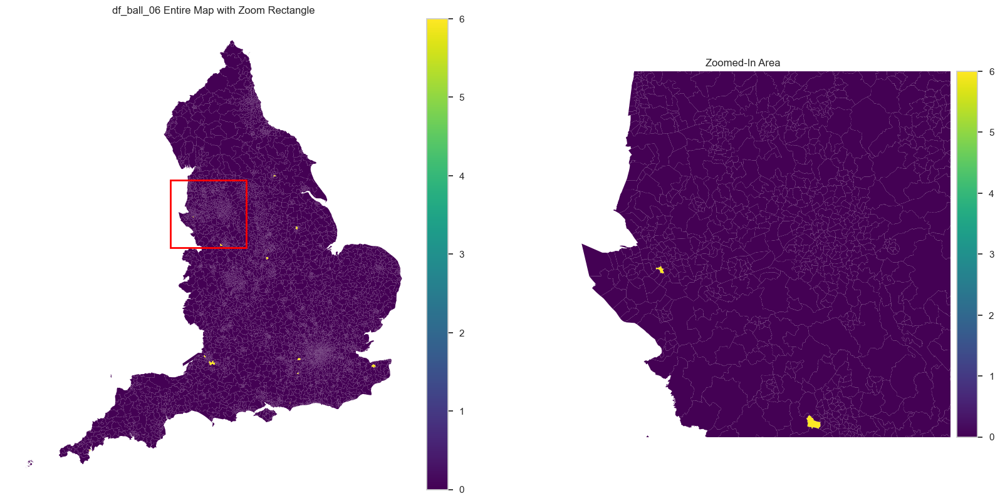

In [76]:
df_ball_06 = pd.merge(uk_shape, df_ball_6, on=['ward', 'wardcode'], how='left')

df_ball_06['ball'].fillna(0, inplace=True)

filtered_merge_u = df_ball_06[df_ball_06['Local_Authority_D_x'].isin(wards_of_interest)]  


if filtered_merge_u.empty:
    print("No data found for the specified wards.")
else:
    minx, miny, maxx, maxy = filtered_merge_u.total_bounds

    print(f"Original Bounds: minx={minx}, maxx={maxx}, miny={miny}, maxy={maxy}")

    width = maxx - minx
    height = maxy - miny

    expanded_width = width * 2
    expanded_height = height * 4

    center_x = (minx + maxx) / 2
    center_y = (miny + maxy) / 2

    new_minx = center_x - expanded_width / 2
    new_maxx = center_x + expanded_width / 2
    new_miny = (center_y - expanded_height / 2)
    new_maxy = (center_y + expanded_height / 2) 

    print(f"Expanded and Adjusted Bounds: minx={new_minx}, maxx={new_maxx}, miny={new_miny}, maxy={new_maxy}")



    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))

    ax1.set_title("df_ball_06 Entire Map with Zoom Rectangle")
    ax1.set_axis_off()
    divider1 = make_axes_locatable(ax1)
    cax1 = divider1.append_axes("right", size="5%", pad=0.1)
    df_ball_06.plot(column="ball", ax=ax1, legend=True, cax=cax1, cmap='viridis', edgecolor='none')

    rect = patches.Rectangle((new_minx, new_miny), expanded_width, expanded_height, linewidth=2, edgecolor='red', facecolor='none')
    ax1.add_patch(rect)

    ax2.set_title("Zoomed-In Area")
    ax2.set_axis_off()
    divider2 = make_axes_locatable(ax2)
    cax2 = divider2.append_axes("right", size="5%", pad=0.1)
    df_ball_06.plot(column="ball", ax=ax2, legend=True, cax=cax2, cmap='viridis', edgecolor='none')

    ax2.set_xlim(new_minx, new_maxx)
    ax2.set_ylim(new_miny, new_maxy)

    output_dir = 'generated_df/TDABM_figures'
    os.makedirs(output_dir, exist_ok=True)
    
    plt.savefig(os.path.join(output_dir, 'ball6_mapTDABM.png'), bbox_inches='tight')

    
    plt.show()

Original Bounds: minx=332390.20210000034, maxx=390350.2030999996, miny=379748.4975000005, maxy=405357.59699999914
Expanded and Adjusted Bounds: minx=303410.2016000007, maxx=419330.2035999992, miny=341334.8482500026, maxy=443771.24624999706


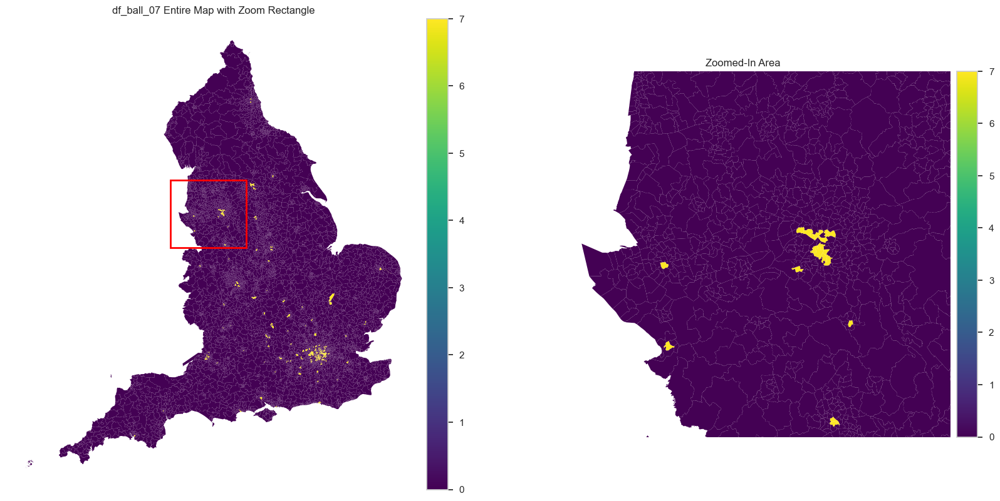

In [77]:
df_ball_07 = pd.merge(uk_shape, df_ball_7, on=['ward', 'wardcode'], how='left')

df_ball_07['ball'].fillna(0, inplace=True)

filtered_merge_u = df_ball_07[df_ball_07['Local_Authority_D_x'].isin(wards_of_interest)]  


if filtered_merge_u.empty:
    print("No data found for the specified wards.")
else:
    minx, miny, maxx, maxy = filtered_merge_u.total_bounds

    print(f"Original Bounds: minx={minx}, maxx={maxx}, miny={miny}, maxy={maxy}")

    width = maxx - minx
    height = maxy - miny

    expanded_width = width * 2
    expanded_height = height * 4

    center_x = (minx + maxx) / 2
    center_y = (miny + maxy) / 2

    new_minx = center_x - expanded_width / 2
    new_maxx = center_x + expanded_width / 2
    new_miny = (center_y - expanded_height / 2) 
    new_maxy = (center_y + expanded_height / 2) 

    print(f"Expanded and Adjusted Bounds: minx={new_minx}, maxx={new_maxx}, miny={new_miny}, maxy={new_maxy}")



    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))

    ax1.set_title("df_ball_07 Entire Map with Zoom Rectangle")
    ax1.set_axis_off()
    divider1 = make_axes_locatable(ax1)
    cax1 = divider1.append_axes("right", size="5%", pad=0.1)
    df_ball_07.plot(column="ball", ax=ax1, legend=True, cax=cax1, cmap='viridis', edgecolor='none')

    rect = patches.Rectangle((new_minx, new_miny), expanded_width, expanded_height, linewidth=2, edgecolor='red', facecolor='none')
    ax1.add_patch(rect)

    ax2.set_title("Zoomed-In Area")
    ax2.set_axis_off()
    divider2 = make_axes_locatable(ax2)
    cax2 = divider2.append_axes("right", size="5%", pad=0.1)
    df_ball_07.plot(column="ball", ax=ax2, legend=True, cax=cax2, cmap='viridis', edgecolor='none')

    ax2.set_xlim(new_minx, new_maxx)
    ax2.set_ylim(new_miny, new_maxy)

    output_dir = 'generated_df/TDABM_figures'
    os.makedirs(output_dir, exist_ok=True)
    
    plt.savefig(os.path.join(output_dir, 'ball7_mapTDABM.png'), bbox_inches='tight')

    
    plt.show()

Original Bounds: minx=332390.20210000034, maxx=390350.2030999996, miny=379748.4975000005, maxy=405357.59699999914
Expanded and Adjusted Bounds: minx=303410.2016000007, maxx=419330.2035999992, miny=341334.8482500026, maxy=443771.24624999706


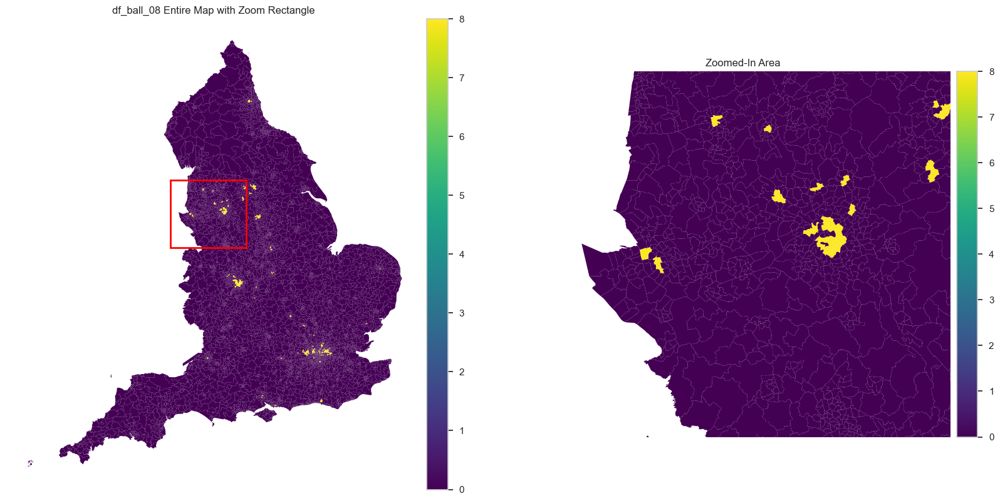

In [78]:
df_ball_08 = pd.merge(uk_shape, df_ball_8, on=['ward', 'wardcode'], how='left')

df_ball_08['ball'].fillna(0, inplace=True)

filtered_merge_u = df_ball_08[df_ball_08['Local_Authority_D_x'].isin(wards_of_interest)]  

if filtered_merge_u.empty:
    print("No data found for the specified wards.")
else:
    minx, miny, maxx, maxy = filtered_merge_u.total_bounds

    print(f"Original Bounds: minx={minx}, maxx={maxx}, miny={miny}, maxy={maxy}")

    width = maxx - minx
    height = maxy - miny

    expanded_width = width * 2
    expanded_height = height * 4

    center_x = (minx + maxx) / 2
    center_y = (miny + maxy) / 2

    new_minx = center_x - expanded_width / 2
    new_maxx = center_x + expanded_width / 2
    new_miny = (center_y - expanded_height / 2) 
    new_maxy = (center_y + expanded_height / 2) 

    print(f"Expanded and Adjusted Bounds: minx={new_minx}, maxx={new_maxx}, miny={new_miny}, maxy={new_maxy}")



    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))

    ax1.set_title("df_ball_08 Entire Map with Zoom Rectangle")
    ax1.set_axis_off()
    divider1 = make_axes_locatable(ax1)
    cax1 = divider1.append_axes("right", size="5%", pad=0.1)
    df_ball_08.plot(column="ball", ax=ax1, legend=True, cax=cax1, cmap='viridis', edgecolor='none')

    rect = patches.Rectangle((new_minx, new_miny), expanded_width, expanded_height, linewidth=2, edgecolor='red', facecolor='none')
    ax1.add_patch(rect)

    ax2.set_title("Zoomed-In Area")
    ax2.set_axis_off()
    divider2 = make_axes_locatable(ax2)
    cax2 = divider2.append_axes("right", size="5%", pad=0.1)
    df_ball_08.plot(column="ball", ax=ax2, legend=True, cax=cax2, cmap='viridis', edgecolor='none')

    ax2.set_xlim(new_minx, new_maxx)
    ax2.set_ylim(new_miny, new_maxy)

    output_dir = 'generated_df/TDABM_figures'
    os.makedirs(output_dir, exist_ok=True)
    
    plt.savefig(os.path.join(output_dir, 'ball8_mapTDABM.png'), bbox_inches='tight')

    
    plt.show()

Original Bounds: minx=332390.20210000034, maxx=390350.2030999996, miny=379748.4975000005, maxy=405357.59699999914
Expanded and Adjusted Bounds: minx=303410.2016000007, maxx=419330.2035999992, miny=341334.8482500026, maxy=443771.24624999706


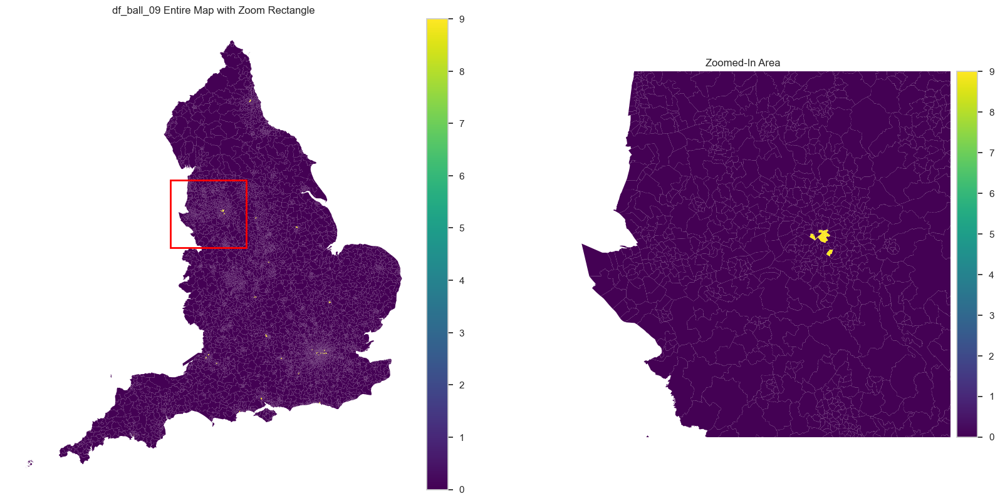

In [79]:
df_ball_09 = pd.merge(uk_shape, df_ball_9, on=['ward', 'wardcode'], how='left')

df_ball_09['ball'].fillna(0, inplace=True)

filtered_merge_u = df_ball_09[df_ball_09['Local_Authority_D_x'].isin(wards_of_interest)]  


if filtered_merge_u.empty:
    print("No data found for the specified wards.")
else:
    minx, miny, maxx, maxy = filtered_merge_u.total_bounds

    print(f"Original Bounds: minx={minx}, maxx={maxx}, miny={miny}, maxy={maxy}")

    width = maxx - minx
    height = maxy - miny

    expanded_width = width * 2
    expanded_height = height * 4

    center_x = (minx + maxx) / 2
    center_y = (miny + maxy) / 2

    new_minx = center_x - expanded_width / 2
    new_maxx = center_x + expanded_width / 2
    new_miny = (center_y - expanded_height / 2) 
    new_maxy = (center_y + expanded_height / 2) 

    print(f"Expanded and Adjusted Bounds: minx={new_minx}, maxx={new_maxx}, miny={new_miny}, maxy={new_maxy}")



    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))

    ax1.set_title("df_ball_09 Entire Map with Zoom Rectangle")
    ax1.set_axis_off()
    divider1 = make_axes_locatable(ax1)
    cax1 = divider1.append_axes("right", size="5%", pad=0.1)
    df_ball_09.plot(column="ball", ax=ax1, legend=True, cax=cax1, cmap='viridis', edgecolor='none')

    rect = patches.Rectangle((new_minx, new_miny), expanded_width, expanded_height, linewidth=2, edgecolor='red', facecolor='none')
    ax1.add_patch(rect)

    ax2.set_title("Zoomed-In Area")
    ax2.set_axis_off()
    divider2 = make_axes_locatable(ax2)
    cax2 = divider2.append_axes("right", size="5%", pad=0.1)
    df_ball_09.plot(column="ball", ax=ax2, legend=True, cax=cax2, cmap='viridis', edgecolor='none')

    ax2.set_xlim(new_minx, new_maxx)
    ax2.set_ylim(new_miny, new_maxy)

    output_dir = 'generated_df/TDABM_figures'
    os.makedirs(output_dir, exist_ok=True)
    
    plt.savefig(os.path.join(output_dir, 'ball9_mapTDABM.png'), bbox_inches='tight')

    
    plt.show()

Original Bounds: minx=332390.20210000034, maxx=390350.2030999996, miny=379748.4975000005, maxy=405357.59699999914
Expanded and Adjusted Bounds: minx=303410.2016000007, maxx=419330.2035999992, miny=341334.8482500026, maxy=443771.24624999706


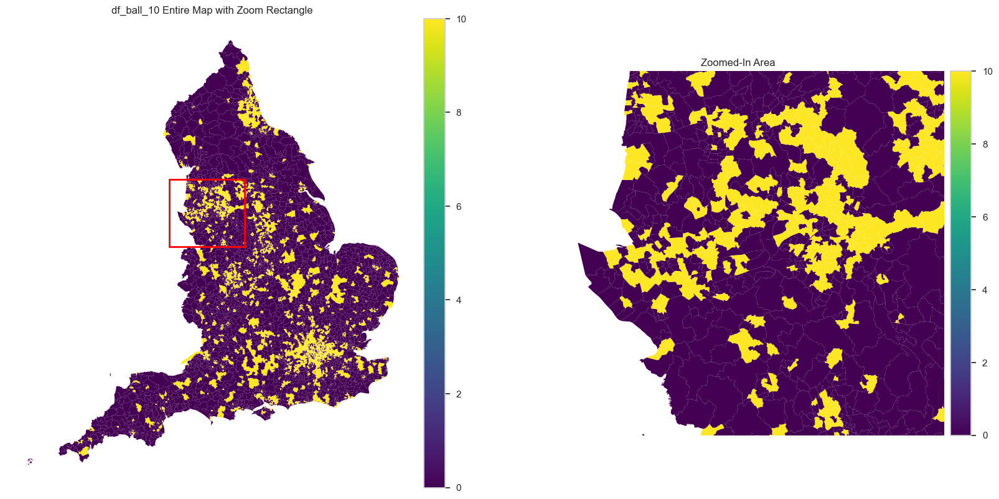

In [80]:
df_ball_10 = pd.merge(uk_shape, df_ball_10, on=['ward', 'wardcode'], how='left')

df_ball_10['ball'].fillna(0, inplace=True)

filtered_merge_u = df_ball_10[df_ball_10['Local_Authority_D_x'].isin(wards_of_interest)]  # Replace 'wardname' with the correct column name if different


if filtered_merge_u.empty:
    print("No data found for the specified wards.")
else:
    minx, miny, maxx, maxy = filtered_merge_u.total_bounds

    print(f"Original Bounds: minx={minx}, maxx={maxx}, miny={miny}, maxy={maxy}")

    width = maxx - minx
    height = maxy - miny

    expanded_width = width * 2
    expanded_height = height * 4

    center_x = (minx + maxx) / 2
    center_y = (miny + maxy) / 2

    new_minx = center_x - expanded_width / 2
    new_maxx = center_x + expanded_width / 2
    new_miny = (center_y - expanded_height / 2) 
    new_maxy = (center_y + expanded_height / 2) 

    print(f"Expanded and Adjusted Bounds: minx={new_minx}, maxx={new_maxx}, miny={new_miny}, maxy={new_maxy}")



    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))

    ax1.set_title("df_ball_10 Entire Map with Zoom Rectangle")
    ax1.set_axis_off()
    divider1 = make_axes_locatable(ax1)
    cax1 = divider1.append_axes("right", size="5%", pad=0.1)
    df_ball_10.plot(column="ball", ax=ax1, legend=True, cax=cax1, cmap='viridis', edgecolor='none')

    rect = patches.Rectangle((new_minx, new_miny), expanded_width, expanded_height, linewidth=2, edgecolor='red', facecolor='none')
    ax1.add_patch(rect)

    ax2.set_title("Zoomed-In Area")
    ax2.set_axis_off()
    divider2 = make_axes_locatable(ax2)
    cax2 = divider2.append_axes("right", size="5%", pad=0.1)
    df_ball_10.plot(column="ball", ax=ax2, legend=True, cax=cax2, cmap='viridis', edgecolor='none')

    ax2.set_xlim(new_minx, new_maxx)
    ax2.set_ylim(new_miny, new_maxy)

    output_dir = 'generated_df/TDABM_figures'
    os.makedirs(output_dir, exist_ok=True)
    
    plt.savefig(os.path.join(output_dir, 'ball10_mapTDABM.png'), bbox_inches='tight')

    
    plt.show()

Original Bounds: minx=332390.20210000034, maxx=390350.2030999996, miny=379748.4975000005, maxy=405357.59699999914
Expanded and Adjusted Bounds: minx=303410.2016000007, maxx=419330.2035999992, miny=341334.8482500026, maxy=443771.24624999706


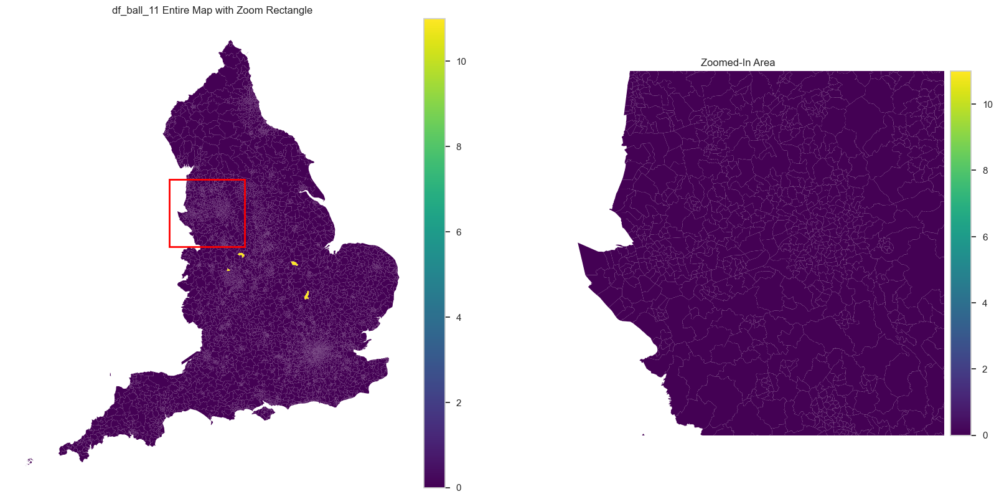

In [81]:
df_ball_11 = pd.merge(uk_shape, df_ball_11, on=['ward', 'wardcode'], how='left')

df_ball_11['ball'].fillna(0, inplace=True)

filtered_merge_u = df_ball_10[df_ball_10['Local_Authority_D_x'].isin(wards_of_interest)]  


if filtered_merge_u.empty:
    print("No data found for the specified wards.")
else:
    minx, miny, maxx, maxy = filtered_merge_u.total_bounds

    print(f"Original Bounds: minx={minx}, maxx={maxx}, miny={miny}, maxy={maxy}")

    width = maxx - minx
    height = maxy - miny

    expanded_width = width * 2
    expanded_height = height * 4

    center_x = (minx + maxx) / 2
    center_y = (miny + maxy) / 2

    new_minx = center_x - expanded_width / 2
    new_maxx = center_x + expanded_width / 2
    new_miny = (center_y - expanded_height / 2) 
    new_maxy = (center_y + expanded_height / 2)

    print(f"Expanded and Adjusted Bounds: minx={new_minx}, maxx={new_maxx}, miny={new_miny}, maxy={new_maxy}")



    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))

    ax1.set_title("df_ball_11 Entire Map with Zoom Rectangle")
    ax1.set_axis_off()
    divider1 = make_axes_locatable(ax1)
    cax1 = divider1.append_axes("right", size="5%", pad=0.1)
    df_ball_11.plot(column="ball", ax=ax1, legend=True, cax=cax1, cmap='viridis', edgecolor='none')

    rect = patches.Rectangle((new_minx, new_miny), expanded_width, expanded_height, linewidth=2, edgecolor='red', facecolor='none')
    ax1.add_patch(rect)

    ax2.set_title("Zoomed-In Area")
    ax2.set_axis_off()
    divider2 = make_axes_locatable(ax2)
    cax2 = divider2.append_axes("right", size="5%", pad=0.1)
    df_ball_11.plot(column="ball", ax=ax2, legend=True, cax=cax2, cmap='viridis', edgecolor='none')

    ax2.set_xlim(new_minx, new_maxx)
    ax2.set_ylim(new_miny, new_maxy)

    output_dir = 'generated_df/TDABM_figures'
    os.makedirs(output_dir, exist_ok=True)
    
    plt.savefig(os.path.join(output_dir, 'ball11_mapTDABM.png'), bbox_inches='tight')

    
    plt.show()

Original Bounds: minx=332390.20210000034, maxx=390350.2030999996, miny=379748.4975000005, maxy=405357.59699999914
Expanded and Adjusted Bounds: minx=303410.2016000007, maxx=419330.2035999992, miny=341334.8482500026, maxy=443771.24624999706


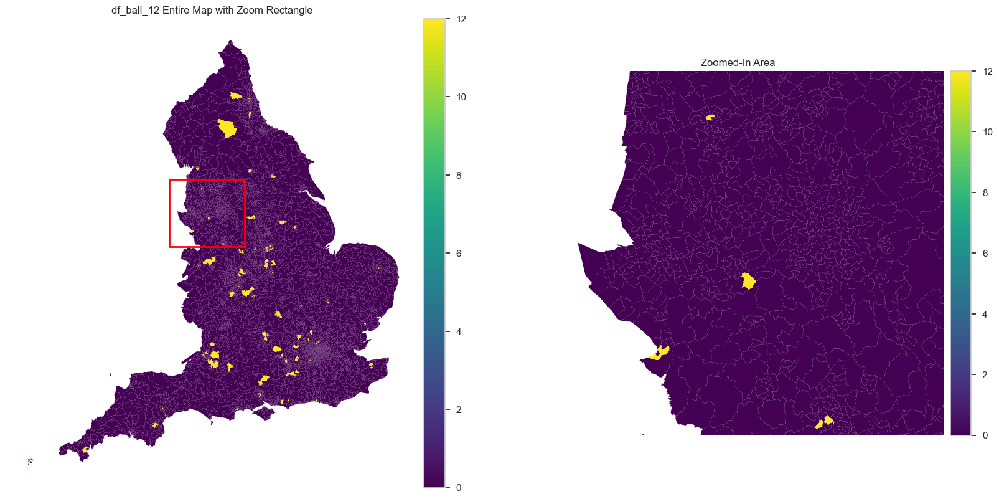

In [82]:
df_ball_12 = pd.merge(uk_shape, df_ball_12, on=['ward', 'wardcode'], how='left')

df_ball_12['ball'].fillna(0, inplace=True)

filtered_merge_u = df_ball_10[df_ball_10['Local_Authority_D_x'].isin(wards_of_interest)]  


if filtered_merge_u.empty:
    print("No data found for the specified wards.")
else:
    minx, miny, maxx, maxy = filtered_merge_u.total_bounds

    print(f"Original Bounds: minx={minx}, maxx={maxx}, miny={miny}, maxy={maxy}")

    width = maxx - minx
    height = maxy - miny

    expanded_width = width * 2
    expanded_height = height * 4

    center_x = (minx + maxx) / 2
    center_y = (miny + maxy) / 2

    new_minx = center_x - expanded_width / 2
    new_maxx = center_x + expanded_width / 2
    new_miny = (center_y - expanded_height / 2) 
    new_maxy = (center_y + expanded_height / 2) 

    print(f"Expanded and Adjusted Bounds: minx={new_minx}, maxx={new_maxx}, miny={new_miny}, maxy={new_maxy}")



    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))

    ax1.set_title("df_ball_12 Entire Map with Zoom Rectangle")
    ax1.set_axis_off()
    divider1 = make_axes_locatable(ax1)
    cax1 = divider1.append_axes("right", size="5%", pad=0.1)
    df_ball_12.plot(column="ball", ax=ax1, legend=True, cax=cax1, cmap='viridis', edgecolor='none')

    rect = patches.Rectangle((new_minx, new_miny), expanded_width, expanded_height, linewidth=2, edgecolor='red', facecolor='none')
    ax1.add_patch(rect)

    ax2.set_title("Zoomed-In Area")
    ax2.set_axis_off()
    divider2 = make_axes_locatable(ax2)
    cax2 = divider2.append_axes("right", size="5%", pad=0.1)
    df_ball_12.plot(column="ball", ax=ax2, legend=True, cax=cax2, cmap='viridis', edgecolor='none')

    ax2.set_xlim(new_minx, new_maxx)
    ax2.set_ylim(new_miny, new_maxy)

    output_dir = 'generated_df/TDABM_figures'
    os.makedirs(output_dir, exist_ok=True)
    
    plt.savefig(os.path.join(output_dir, 'ball12_mapTDABM.png'), bbox_inches='tight')

    
    plt.show()

Original Bounds: minx=332390.20210000034, maxx=390350.2030999996, miny=379748.4975000005, maxy=405357.59699999914
Expanded and Adjusted Bounds: minx=303410.2016000007, maxx=419330.2035999992, miny=341334.8482500026, maxy=443771.24624999706


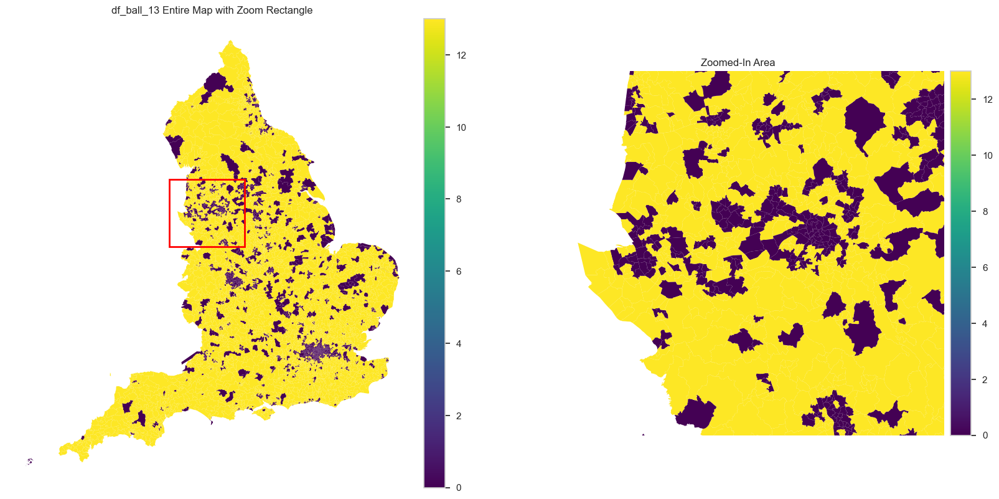

In [83]:
df_ball_13 = pd.merge(uk_shape, df_ball_13, on=['ward', 'wardcode'], how='left')

df_ball_13['ball'].fillna(0, inplace=True)

filtered_merge_u = df_ball_13[df_ball_13['Local_Authority_D_x'].isin(wards_of_interest)]  


if filtered_merge_u.empty:
    print("No data found for the specified wards.")
else:
    minx, miny, maxx, maxy = filtered_merge_u.total_bounds

    print(f"Original Bounds: minx={minx}, maxx={maxx}, miny={miny}, maxy={maxy}")

    width = maxx - minx
    height = maxy - miny

    expanded_width = width * 2
    expanded_height = height * 4

    center_x = (minx + maxx) / 2
    center_y = (miny + maxy) / 2

    new_minx = center_x - expanded_width / 2
    new_maxx = center_x + expanded_width / 2
    new_miny = (center_y - expanded_height / 2) 
    new_maxy = (center_y + expanded_height / 2) 

    print(f"Expanded and Adjusted Bounds: minx={new_minx}, maxx={new_maxx}, miny={new_miny}, maxy={new_maxy}")



    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))

    ax1.set_title("df_ball_13 Entire Map with Zoom Rectangle")
    ax1.set_axis_off()
    divider1 = make_axes_locatable(ax1)
    cax1 = divider1.append_axes("right", size="5%", pad=0.1)
    df_ball_13.plot(column="ball", ax=ax1, legend=True, cax=cax1, cmap='viridis', edgecolor='none')

    rect = patches.Rectangle((new_minx, new_miny), expanded_width, expanded_height, linewidth=2, edgecolor='red', facecolor='none')
    ax1.add_patch(rect)

    ax2.set_title("Zoomed-In Area")
    ax2.set_axis_off()
    divider2 = make_axes_locatable(ax2)
    cax2 = divider2.append_axes("right", size="5%", pad=0.1)
    df_ball_13.plot(column="ball", ax=ax2, legend=True, cax=cax2, cmap='viridis', edgecolor='none')

    ax2.set_xlim(new_minx, new_maxx)
    ax2.set_ylim(new_miny, new_maxy)

    output_dir = 'generated_df/TDABM_figures'
    os.makedirs(output_dir, exist_ok=True)
    
    plt.savefig(os.path.join(output_dir, 'ball13_mapTDABM.png'), bbox_inches='tight')

    
    plt.show()

Original Bounds: minx=332390.20210000034, maxx=390350.2030999996, miny=379748.4975000005, maxy=405357.59699999914
Expanded and Adjusted Bounds: minx=303410.2016000007, maxx=419330.2035999992, miny=341334.8482500026, maxy=443771.24624999706


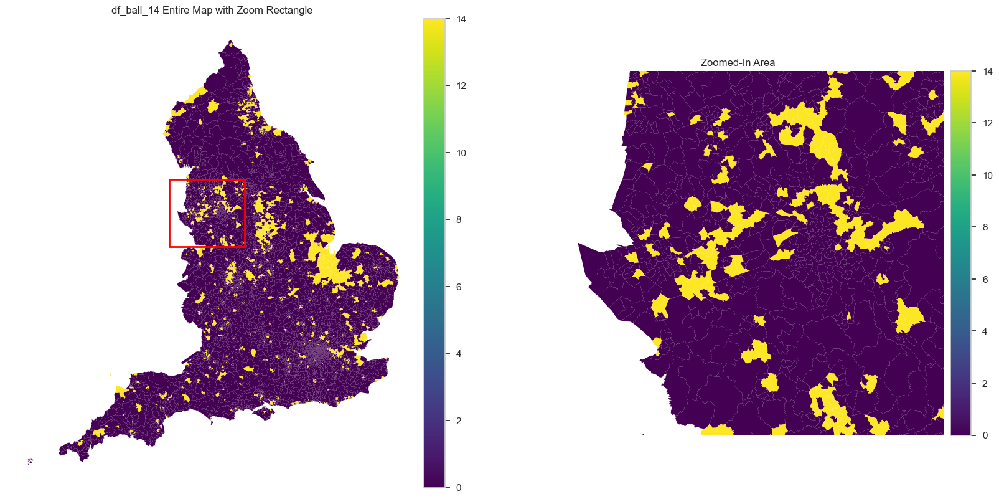

In [84]:
df_ball_14 = pd.merge(uk_shape, df_ball_14, on=['ward', 'wardcode'], how='left')

df_ball_14['ball'].fillna(0, inplace=True)

filtered_merge_u = df_ball_14[df_ball_14['Local_Authority_D_x'].isin(wards_of_interest)] 


if filtered_merge_u.empty:
    print("No data found for the specified wards.")
else:
    minx, miny, maxx, maxy = filtered_merge_u.total_bounds

    print(f"Original Bounds: minx={minx}, maxx={maxx}, miny={miny}, maxy={maxy}")

    width = maxx - minx
    height = maxy - miny

    expanded_width = width * 2
    expanded_height = height * 4

    center_x = (minx + maxx) / 2
    center_y = (miny + maxy) / 2

    new_minx = center_x - expanded_width / 2
    new_maxx = center_x + expanded_width / 2
    new_miny = (center_y - expanded_height / 2) 
    new_maxy = (center_y + expanded_height / 2) 

    print(f"Expanded and Adjusted Bounds: minx={new_minx}, maxx={new_maxx}, miny={new_miny}, maxy={new_maxy}")



    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))

    ax1.set_title("df_ball_14 Entire Map with Zoom Rectangle")
    ax1.set_axis_off()
    divider1 = make_axes_locatable(ax1)
    cax1 = divider1.append_axes("right", size="5%", pad=0.1)
    df_ball_14.plot(column="ball", ax=ax1, legend=True, cax=cax1, cmap='viridis', edgecolor='none')

    rect = patches.Rectangle((new_minx, new_miny), expanded_width, expanded_height, linewidth=2, edgecolor='red', facecolor='none')
    ax1.add_patch(rect)

    ax2.set_title("Zoomed-In Area")
    ax2.set_axis_off()
    divider2 = make_axes_locatable(ax2)
    cax2 = divider2.append_axes("right", size="5%", pad=0.1)
    df_ball_14.plot(column="ball", ax=ax2, legend=True, cax=cax2, cmap='viridis', edgecolor='none')

    ax2.set_xlim(new_minx, new_maxx)
    ax2.set_ylim(new_miny, new_maxy)

    output_dir = 'generated_df/TDABM_figures'
    os.makedirs(output_dir, exist_ok=True)
    
    plt.savefig(os.path.join(output_dir, 'ball14_mapTDABM.png'), bbox_inches='tight')

    
    plt.show()

Original Bounds: minx=332390.20210000034, maxx=390350.2030999996, miny=379748.4975000005, maxy=405357.59699999914
Expanded and Adjusted Bounds: minx=303410.2016000007, maxx=419330.2035999992, miny=341334.8482500026, maxy=443771.24624999706


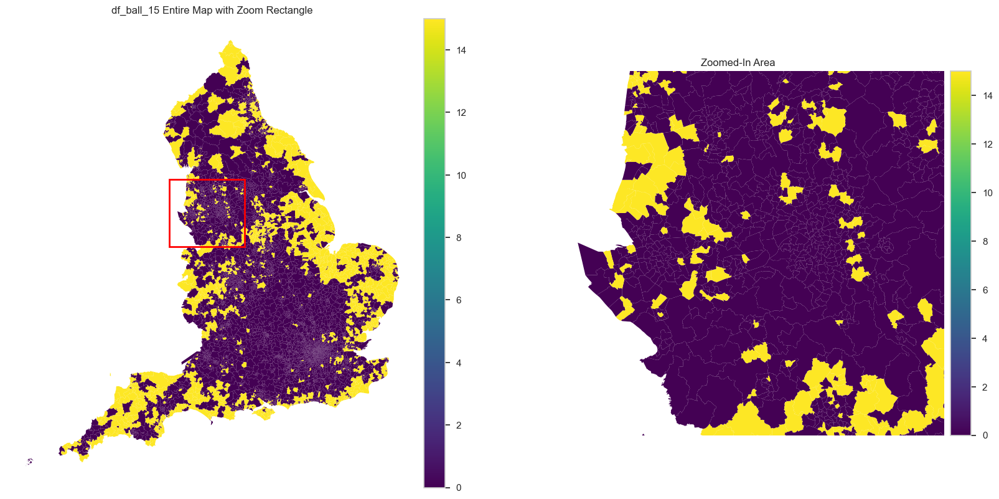

In [85]:
df_ball_15 = pd.merge(uk_shape, df_ball_15, on=['ward', 'wardcode'], how='left')

df_ball_15['ball'].fillna(0, inplace=True)

filtered_merge_u = df_ball_15[df_ball_15['Local_Authority_D_x'].isin(wards_of_interest)]  


if filtered_merge_u.empty:
    print("No data found for the specified wards.")
else:
    minx, miny, maxx, maxy = filtered_merge_u.total_bounds

    print(f"Original Bounds: minx={minx}, maxx={maxx}, miny={miny}, maxy={maxy}")

    width = maxx - minx
    height = maxy - miny

    expanded_width = width * 2
    expanded_height = height * 4

    center_x = (minx + maxx) / 2
    center_y = (miny + maxy) / 2

    new_minx = center_x - expanded_width / 2
    new_maxx = center_x + expanded_width / 2
    new_miny = (center_y - expanded_height / 2) 
    new_maxy = (center_y + expanded_height / 2) 

    print(f"Expanded and Adjusted Bounds: minx={new_minx}, maxx={new_maxx}, miny={new_miny}, maxy={new_maxy}")



    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))

    ax1.set_title("df_ball_15 Entire Map with Zoom Rectangle")
    ax1.set_axis_off()
    divider1 = make_axes_locatable(ax1)
    cax1 = divider1.append_axes("right", size="5%", pad=0.1)
    df_ball_15.plot(column="ball", ax=ax1, legend=True, cax=cax1, cmap='viridis', edgecolor='none')

    rect = patches.Rectangle((new_minx, new_miny), expanded_width, expanded_height, linewidth=2, edgecolor='red', facecolor='none')
    ax1.add_patch(rect)

    ax2.set_title("Zoomed-In Area")
    ax2.set_axis_off()
    divider2 = make_axes_locatable(ax2)
    cax2 = divider2.append_axes("right", size="5%", pad=0.1)
    df_ball_15.plot(column="ball", ax=ax2, legend=True, cax=cax2, cmap='viridis', edgecolor='none')

    ax2.set_xlim(new_minx, new_maxx)
    ax2.set_ylim(new_miny, new_maxy)

    output_dir = 'generated_df/TDABM_figures'
    os.makedirs(output_dir, exist_ok=True)
    
    plt.savefig(os.path.join(output_dir, 'ball15_mapTDABM.png'), bbox_inches='tight')

    
    plt.show()

Original Bounds: minx=332390.20210000034, maxx=390350.2030999996, miny=379748.4975000005, maxy=405357.59699999914
Expanded and Adjusted Bounds: minx=303410.2016000007, maxx=419330.2035999992, miny=341334.8482500026, maxy=443771.24624999706


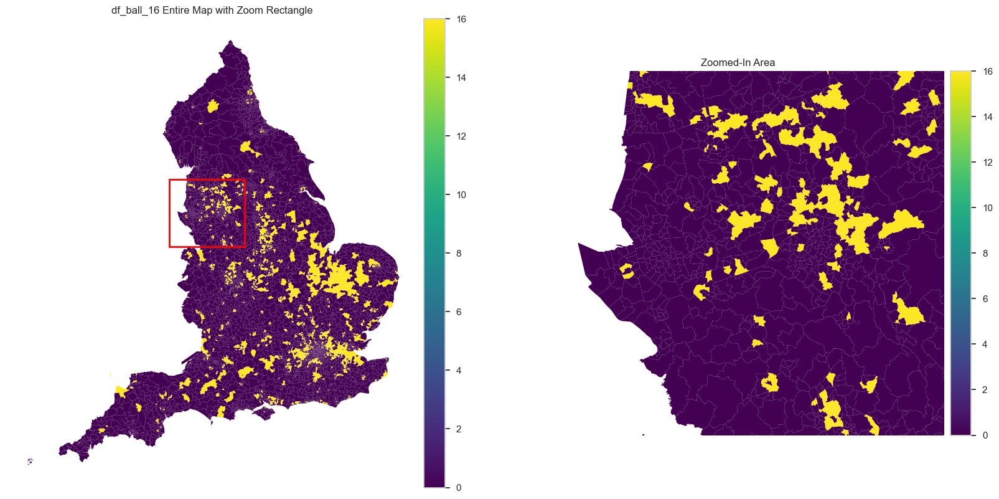

In [86]:
df_ball_16 = pd.merge(uk_shape, df_ball_16, on=['ward', 'wardcode'], how='left')

df_ball_16['ball'].fillna(0, inplace=True)

filtered_merge_u = df_ball_16[df_ball_16['Local_Authority_D_x'].isin(wards_of_interest)]  


if filtered_merge_u.empty:
    print("No data found for the specified wards.")
else:
    minx, miny, maxx, maxy = filtered_merge_u.total_bounds

    print(f"Original Bounds: minx={minx}, maxx={maxx}, miny={miny}, maxy={maxy}")

    width = maxx - minx
    height = maxy - miny

    expanded_width = width * 2
    expanded_height = height * 4

    center_x = (minx + maxx) / 2
    center_y = (miny + maxy) / 2

    new_minx = center_x - expanded_width / 2
    new_maxx = center_x + expanded_width / 2
    new_miny = (center_y - expanded_height / 2) 
    new_maxy = (center_y + expanded_height / 2) 

    print(f"Expanded and Adjusted Bounds: minx={new_minx}, maxx={new_maxx}, miny={new_miny}, maxy={new_maxy}")



    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))

    ax1.set_title("df_ball_16 Entire Map with Zoom Rectangle")
    ax1.set_axis_off()
    divider1 = make_axes_locatable(ax1)
    cax1 = divider1.append_axes("right", size="5%", pad=0.1)
    df_ball_16.plot(column="ball", ax=ax1, legend=True, cax=cax1, cmap='viridis', edgecolor='none')

    rect = patches.Rectangle((new_minx, new_miny), expanded_width, expanded_height, linewidth=2, edgecolor='red', facecolor='none')
    ax1.add_patch(rect)

    ax2.set_title("Zoomed-In Area")
    ax2.set_axis_off()
    divider2 = make_axes_locatable(ax2)
    cax2 = divider2.append_axes("right", size="5%", pad=0.1)
    df_ball_16.plot(column="ball", ax=ax2, legend=True, cax=cax2, cmap='viridis', edgecolor='none')

    ax2.set_xlim(new_minx, new_maxx)
    ax2.set_ylim(new_miny, new_maxy)

    output_dir = 'generated_df/TDABM_figures'
    os.makedirs(output_dir, exist_ok=True)
    
    plt.savefig(os.path.join(output_dir, 'ball16_mapTDABM.png'), bbox_inches='tight')

    
    plt.show()

Original Bounds: minx=332390.20210000034, maxx=390350.2030999996, miny=379748.4975000005, maxy=405357.59699999914
Expanded and Adjusted Bounds: minx=303410.2016000007, maxx=419330.2035999992, miny=341334.8482500026, maxy=443771.24624999706


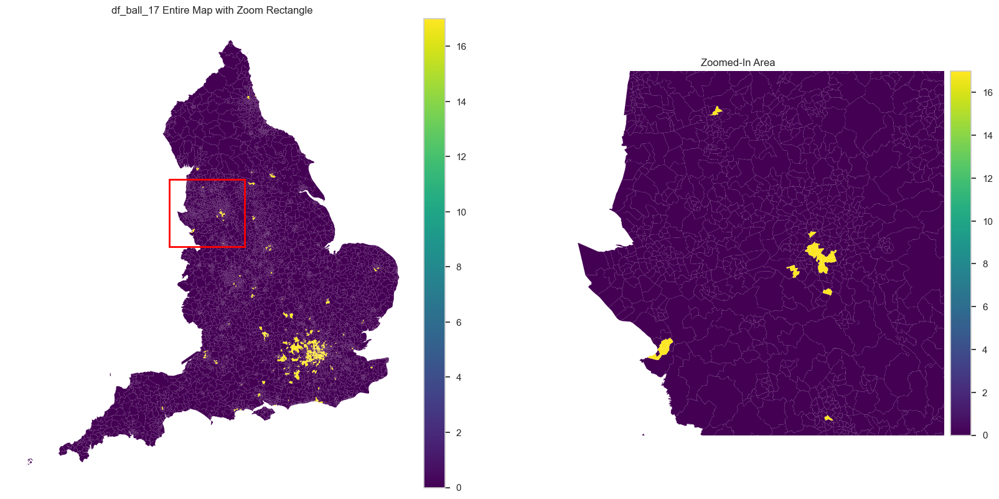

In [87]:
df_ball_17 = pd.merge(uk_shape, df_ball_17, on=['ward', 'wardcode'], how='left')

df_ball_17['ball'].fillna(0, inplace=True)

filtered_merge_u = df_ball_17[df_ball_17['Local_Authority_D_x'].isin(wards_of_interest)]  


if filtered_merge_u.empty:
    print("No data found for the specified wards.")
else:
    minx, miny, maxx, maxy = filtered_merge_u.total_bounds

    print(f"Original Bounds: minx={minx}, maxx={maxx}, miny={miny}, maxy={maxy}")

    width = maxx - minx
    height = maxy - miny

    expanded_width = width * 2
    expanded_height = height * 4

    center_x = (minx + maxx) / 2
    center_y = (miny + maxy) / 2

    new_minx = center_x - expanded_width / 2
    new_maxx = center_x + expanded_width / 2
    new_miny = (center_y - expanded_height / 2) 
    new_maxy = (center_y + expanded_height / 2) 

    print(f"Expanded and Adjusted Bounds: minx={new_minx}, maxx={new_maxx}, miny={new_miny}, maxy={new_maxy}")



    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))

    ax1.set_title("df_ball_17 Entire Map with Zoom Rectangle")
    ax1.set_axis_off()
    divider1 = make_axes_locatable(ax1)
    cax1 = divider1.append_axes("right", size="5%", pad=0.1)
    df_ball_17.plot(column="ball", ax=ax1, legend=True, cax=cax1, cmap='viridis', edgecolor='none')

    rect = patches.Rectangle((new_minx, new_miny), expanded_width, expanded_height, linewidth=2, edgecolor='red', facecolor='none')
    ax1.add_patch(rect)

    ax2.set_title("Zoomed-In Area")
    ax2.set_axis_off()
    divider2 = make_axes_locatable(ax2)
    cax2 = divider2.append_axes("right", size="5%", pad=0.1)
    df_ball_17.plot(column="ball", ax=ax2, legend=True, cax=cax2, cmap='viridis', edgecolor='none')

    ax2.set_xlim(new_minx, new_maxx)
    ax2.set_ylim(new_miny, new_maxy)

    output_dir = 'generated_df/TDABM_figures'
    os.makedirs(output_dir, exist_ok=True)
    
    plt.savefig(os.path.join(output_dir, 'ball17_mapTDABM.png'), bbox_inches='tight')

    
    plt.show()

Original Bounds: minx=332390.20210000034, maxx=390350.2030999996, miny=379748.4975000005, maxy=405357.59699999914
Expanded and Adjusted Bounds: minx=303410.2016000007, maxx=419330.2035999992, miny=341334.8482500026, maxy=443771.24624999706


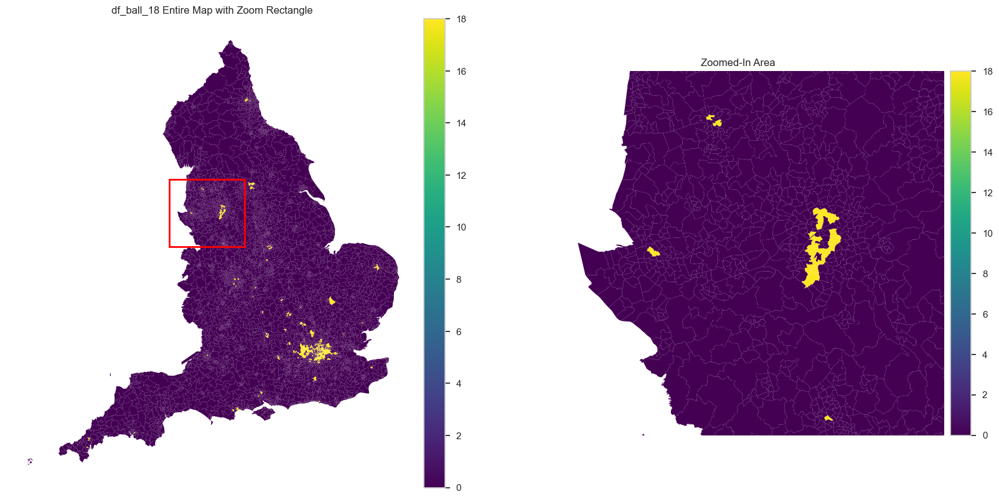

In [88]:
df_ball_18 = pd.merge(uk_shape, df_ball_18, on=['ward', 'wardcode'], how='left')

df_ball_18['ball'].fillna(0, inplace=True)

filtered_merge_u = df_ball_18[df_ball_18['Local_Authority_D_x'].isin(wards_of_interest)]  


if filtered_merge_u.empty:
    print("No data found for the specified wards.")
else:
    # Get the total bounds of the filtered area
    minx, miny, maxx, maxy = filtered_merge_u.total_bounds

    print(f"Original Bounds: minx={minx}, maxx={maxx}, miny={miny}, maxy={maxy}")

    width = maxx - minx
    height = maxy - miny

    expanded_width = width * 2
    expanded_height = height * 4

    center_x = (minx + maxx) / 2
    center_y = (miny + maxy) / 2

    new_minx = center_x - expanded_width / 2
    new_maxx = center_x + expanded_width / 2
    new_miny = (center_y - expanded_height / 2) 
    new_maxy = (center_y + expanded_height / 2) 

    print(f"Expanded and Adjusted Bounds: minx={new_minx}, maxx={new_maxx}, miny={new_miny}, maxy={new_maxy}")



    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))

    ax1.set_title("df_ball_18 Entire Map with Zoom Rectangle")
    ax1.set_axis_off()
    divider1 = make_axes_locatable(ax1)
    cax1 = divider1.append_axes("right", size="5%", pad=0.1)
    df_ball_18.plot(column="ball", ax=ax1, legend=True, cax=cax1, cmap='viridis', edgecolor='none')

    rect = patches.Rectangle((new_minx, new_miny), expanded_width, expanded_height, linewidth=2, edgecolor='red', facecolor='none')
    ax1.add_patch(rect)

    ax2.set_title("Zoomed-In Area")
    ax2.set_axis_off()
    divider2 = make_axes_locatable(ax2)
    cax2 = divider2.append_axes("right", size="5%", pad=0.1)
    df_ball_18.plot(column="ball", ax=ax2, legend=True, cax=cax2, cmap='viridis', edgecolor='none')

    ax2.set_xlim(new_minx, new_maxx)
    ax2.set_ylim(new_miny, new_maxy)

    output_dir = 'generated_df/TDABM_figures'
    os.makedirs(output_dir, exist_ok=True)
    
    plt.savefig(os.path.join(output_dir, 'ball18_mapTDABM.png'), bbox_inches='tight')

    
    plt.show()

Original Bounds: minx=332390.20210000034, maxx=390350.2030999996, miny=379748.4975000005, maxy=405357.59699999914
Expanded and Adjusted Bounds: minx=303410.2016000007, maxx=419330.2035999992, miny=341334.8482500026, maxy=443771.24624999706


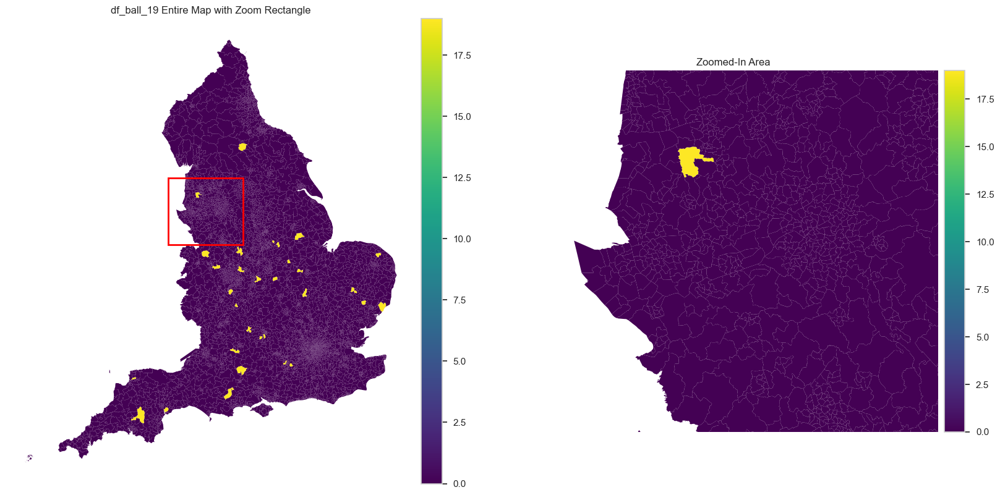

In [89]:
df_ball_19 = pd.merge(uk_shape, df_ball_19, on=['ward', 'wardcode'], how='left')

df_ball_19['ball'].fillna(0, inplace=True)

filtered_merge_u = df_ball_19[df_ball_19['Local_Authority_D_x'].isin(wards_of_interest)]  


if filtered_merge_u.empty:
    print("No data found for the specified wards.")
else:
    minx, miny, maxx, maxy = filtered_merge_u.total_bounds

    print(f"Original Bounds: minx={minx}, maxx={maxx}, miny={miny}, maxy={maxy}")

    width = maxx - minx
    height = maxy - miny

    expanded_width = width * 2
    expanded_height = height * 4

    center_x = (minx + maxx) / 2
    center_y = (miny + maxy) / 2

    new_minx = center_x - expanded_width / 2
    new_maxx = center_x + expanded_width / 2
    new_miny = (center_y - expanded_height / 2) 
    new_maxy = (center_y + expanded_height / 2) 

    print(f"Expanded and Adjusted Bounds: minx={new_minx}, maxx={new_maxx}, miny={new_miny}, maxy={new_maxy}")



    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))

    ax1.set_title("df_ball_19 Entire Map with Zoom Rectangle")
    ax1.set_axis_off()
    divider1 = make_axes_locatable(ax1)
    cax1 = divider1.append_axes("right", size="5%", pad=0.1)
    df_ball_19.plot(column="ball", ax=ax1, legend=True, cax=cax1, cmap='viridis', edgecolor='none')

    rect = patches.Rectangle((new_minx, new_miny), expanded_width, expanded_height, linewidth=2, edgecolor='red', facecolor='none')
    ax1.add_patch(rect)

    ax2.set_title("Zoomed-In Area")
    ax2.set_axis_off()
    divider2 = make_axes_locatable(ax2)
    cax2 = divider2.append_axes("right", size="5%", pad=0.1)
    df_ball_19.plot(column="ball", ax=ax2, legend=True, cax=cax2, cmap='viridis', edgecolor='none')

    ax2.set_xlim(new_minx, new_maxx)
    ax2.set_ylim(new_miny, new_maxy)

    output_dir = 'generated_df/TDABM_figures'
    os.makedirs(output_dir, exist_ok=True)
    
    plt.savefig(os.path.join(output_dir, 'ball19_mapTDABM.png'), bbox_inches='tight')

    
    plt.show()

Original Bounds: minx=332390.20210000034, maxx=390350.2030999996, miny=379748.4975000005, maxy=405357.59699999914
Expanded and Adjusted Bounds: minx=303410.2016000007, maxx=419330.2035999992, miny=341334.8482500026, maxy=443771.24624999706


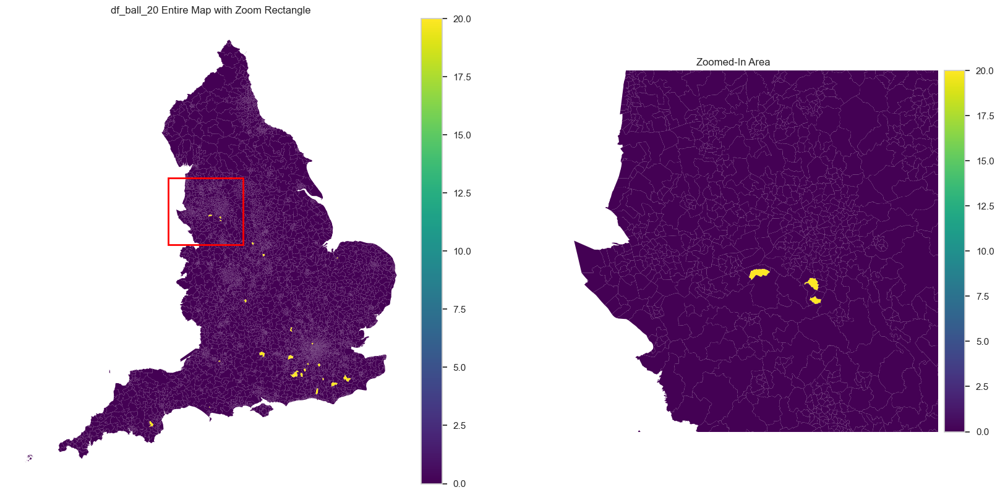

In [90]:
df_ball_20 = pd.merge(uk_shape, df_ball_20, on=['ward', 'wardcode'], how='left')

df_ball_20['ball'].fillna(0, inplace=True)

filtered_merge_u = df_ball_20[df_ball_20['Local_Authority_D_x'].isin(wards_of_interest)]  


if filtered_merge_u.empty:
    print("No data found for the specified wards.")
else:
    minx, miny, maxx, maxy = filtered_merge_u.total_bounds

    print(f"Original Bounds: minx={minx}, maxx={maxx}, miny={miny}, maxy={maxy}")

    width = maxx - minx
    height = maxy - miny

    expanded_width = width * 2
    expanded_height = height * 4

    center_x = (minx + maxx) / 2
    center_y = (miny + maxy) / 2

    new_minx = center_x - expanded_width / 2
    new_maxx = center_x + expanded_width / 2
    new_miny = (center_y - expanded_height / 2) 
    new_maxy = (center_y + expanded_height / 2) 

    print(f"Expanded and Adjusted Bounds: minx={new_minx}, maxx={new_maxx}, miny={new_miny}, maxy={new_maxy}")



    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))

    ax1.set_title("df_ball_20 Entire Map with Zoom Rectangle")
    ax1.set_axis_off()
    divider1 = make_axes_locatable(ax1)
    cax1 = divider1.append_axes("right", size="5%", pad=0.1)
    df_ball_20.plot(column="ball", ax=ax1, legend=True, cax=cax1, cmap='viridis', edgecolor='none')

    rect = patches.Rectangle((new_minx, new_miny), expanded_width, expanded_height, linewidth=2, edgecolor='red', facecolor='none')
    ax1.add_patch(rect)

    ax2.set_title("Zoomed-In Area")
    ax2.set_axis_off()
    divider2 = make_axes_locatable(ax2)
    cax2 = divider2.append_axes("right", size="5%", pad=0.1)
    df_ball_20.plot(column="ball", ax=ax2, legend=True, cax=cax2, cmap='viridis', edgecolor='none')

    ax2.set_xlim(new_minx, new_maxx)
    ax2.set_ylim(new_miny, new_maxy)

    output_dir = 'generated_df/TDABM_figures'
    os.makedirs(output_dir, exist_ok=True)
    
    plt.savefig(os.path.join(output_dir, 'ball20_mapTDABM.png'), bbox_inches='tight')

    
    plt.show()